<a href="https://colab.research.google.com/github/Azad-Me/Appliances-Energy-Prediction-by-Linear-Regression/blob/main/Appliances_Energy_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    -  **Appliances Energy Predictions**



##### **Project Type**    - Regression
##### **Contribution**    - Individual


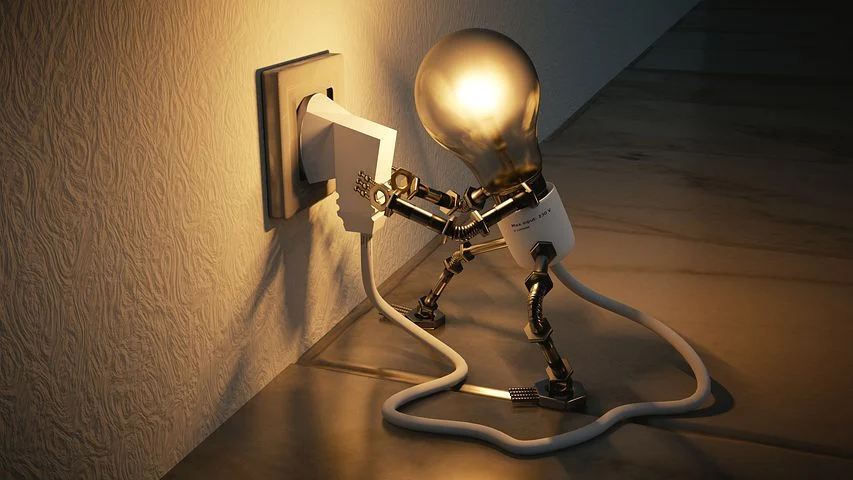

# **Project Summary -**

Appliances Energy Dataset is providing the very useful information over 29 features including the datapoints on Visibility,Atmospheric Pressure, Windspeed and Dewpoint of surrounding area. We all know the relation between the surrounding temperature and household energy consumption pattern in various regions of world.For e.g In South India the Diuranal temperature change is low and revolves around 3-4 degrees. The perinial temperature is high and hence they might require cooling equipments more fequently. Hence incresing their energy consumption. This relationship have been expressed in the Appliances Energy Dataset.\
In the Project we are going to perform a EDA to deep dive into the trends hidden in the Data. In addition with it we are going to perform the Linear Regression model to predict the basic energy consumption by the Appliances.
In this project we are finding the relationship between 28 features in response with one dependent variable, so that we could be more accurate while performing the Predictions.

# **GitHub Link -**

https://github.com/Azad-Me/Appliances-Energy-Prediction-by-Linear-Regression

# **Problem Statement**


The Dataset is at 10 min for about 4.5 months. The house temperature and humidity conditions were monitored with a ZigBee wireless sensor network.Each wireless node transmitted the temperature and humidity conditions around 3.3 min. Then, the wireless data was averaged for 10 minutes. The energy data was logged every 10 minutes with m-bus energy metres. Weather from the nearest airport weather station(Chievres Airport,Belgium) was downloaded from a public data set from Reliable Prognosis (rp5.ru) and merged together with the experimental data sets using the date and time column. Two random variables have been included in the data set for testing the regression models and to filter out non-predictive attributes. You need to predict the energy use of appliances.

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [150]:
# Import Libraries
import numpy as np
import pandas as pd
from numpy import math

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as miss

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 
from sklearn.model_selection import GridSearchCV ,RandomizedSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor

import warnings
warnings.filterwarnings('ignore') 

from scipy.stats import *
from sklearn.linear_model import Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from xgboost import XGBRegressor

In [3]:
!pip install plotly.express
import plotly.express as px

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### Dataset Loading

In [4]:
# Load Dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
path = '/content/drive/MyDrive/dat/Dataset'
first_df= pd.read_csv( path + '/data_application_energy.csv')

### Dataset First View

In [6]:
# Dataset First Look
first_df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


### Dataset Rows & Columns count

In [7]:
# Dataset Rows & Columns count
print('Total columns are',len(first_df.columns))
print('Total rows are',len(first_df['lights']))

Total columns are 29
Total rows are 19735


### Dataset Information

In [8]:
# Dataset Info
first_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

#### Duplicate Values

In [9]:
# Dataset Duplicate Value Count
print('There are total',len(first_df[first_df.duplicated()]), 'duplicate columns.')

There are total 0 duplicate columns.


#### Missing Values/Null Values

In [10]:
# Missing Values/Null Values Count
for i in first_df.columns:
  print(f' {i} - {len(first_df[first_df[i].isnull()])} ')

 date - 0 
 Appliances - 0 
 lights - 0 
 T1 - 0 
 RH_1 - 0 
 T2 - 0 
 RH_2 - 0 
 T3 - 0 
 RH_3 - 0 
 T4 - 0 
 RH_4 - 0 
 T5 - 0 
 RH_5 - 0 
 T6 - 0 
 RH_6 - 0 
 T7 - 0 
 RH_7 - 0 
 T8 - 0 
 RH_8 - 0 
 T9 - 0 
 RH_9 - 0 
 T_out - 0 
 Press_mm_hg - 0 
 RH_out - 0 
 Windspeed - 0 
 Visibility - 0 
 Tdewpoint - 0 
 rv1 - 0 
 rv2 - 0 


<Axes: >

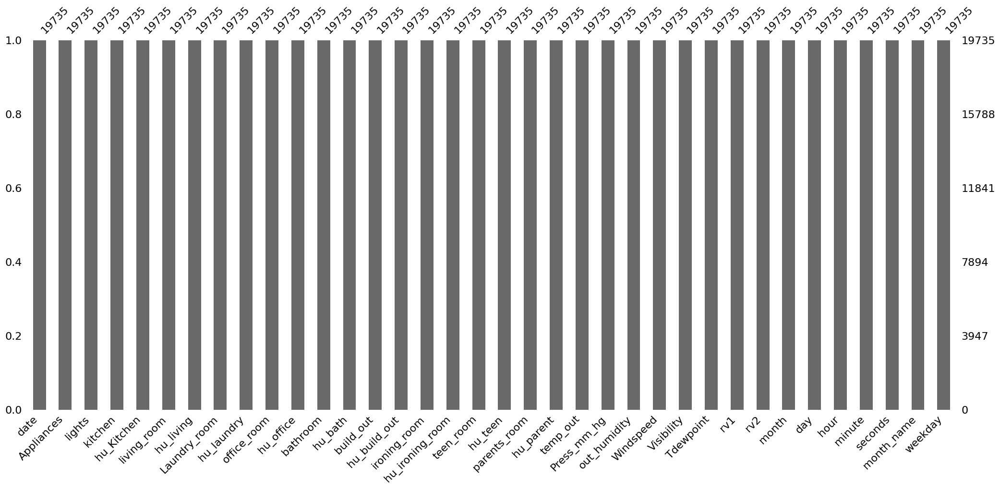

In [151]:
# Visualizing the missing values
miss.bar(first_df)

### What did you know about your dataset?

Answer Here.
> There are total 29 features. Out of which 'Appliances' is our dependent variable.
 
> There are no duplicate columns and no null values.

> The datatype is mixed and not so specific.

## ***2. Understanding Your Variables***

In [12]:
# Dataset Columns
first_df.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [13]:
# Dataset Describe
first_df.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


### Variables Description 


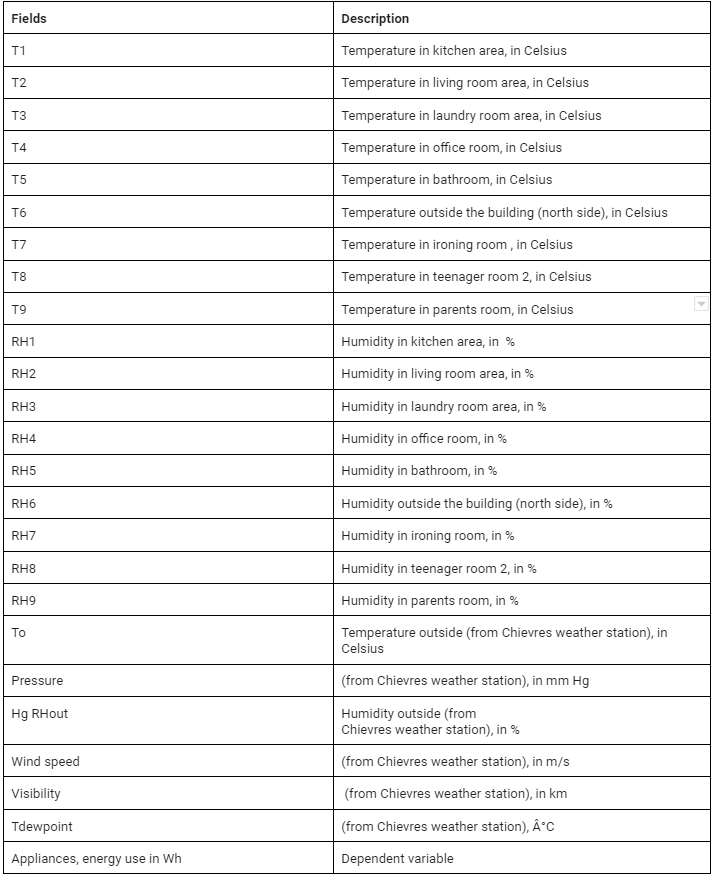

### Check Unique Values for each variable.

In [14]:
# Check Unique Values for each variable.
for i in first_df.columns:
  print(f'Number of unique values in {i} is {first_df[i].nunique()} ')

Number of unique values in date is 19735 
Number of unique values in Appliances is 92 
Number of unique values in lights is 8 
Number of unique values in T1 is 722 
Number of unique values in RH_1 is 2547 
Number of unique values in T2 is 1650 
Number of unique values in RH_2 is 3376 
Number of unique values in T3 is 1426 
Number of unique values in RH_3 is 2618 
Number of unique values in T4 is 1390 
Number of unique values in RH_4 is 2987 
Number of unique values in T5 is 2263 
Number of unique values in RH_5 is 7571 
Number of unique values in T6 is 4446 
Number of unique values in RH_6 is 9709 
Number of unique values in T7 is 1955 
Number of unique values in RH_7 is 5891 
Number of unique values in T8 is 2228 
Number of unique values in RH_8 is 6649 
Number of unique values in T9 is 924 
Number of unique values in RH_9 is 3388 
Number of unique values in T_out is 1730 
Number of unique values in Press_mm_hg is 2189 
Number of unique values in RH_out is 566 
Number of unique values

## 3. ***Data Wrangling***

### Data Wrangling Code

#### The Function for calculating the outliers.

In [15]:
def cal_out(df):
  '''The Following piece of code is calculating the outliers for every feature
     and replacing it with null values, so that by calling the null values we could easily find the number of  oultiers.'''
  
  for i in df.columns:
    sort = df[i].sort_values()
    Q1 = np.percentile(sort , 25 , interpolation='midpoint')
    Q2 = np.percentile(sort , 50 , interpolation='midpoint')
    Q3 = np.percentile(sort , 75 , interpolation='midpoint')

    IQR = Q3 - Q1
    
    Lower_limit = Q1 - (1.5 * IQR)
    Upper_limit = Q3 + (1.5 * IQR)
    
    for j in df[i]:
      if ((j > Upper_limit) or (j < Lower_limit)) :
        third_df[i].replace( j , np.nan,inplace = True)
  
  return third_df

In [16]:
# Write your code to make your dataset analysis ready.
first_df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


#### Renaming The Columns according to the Variable Description.

In [17]:
first_df.rename(columns={'T1': 'kitchen', 'RH_1':'hu_Kitchen', 'T2':'living_room', 'RH_2': 'hu_living', 'T3':'Laundry_room',
       'RH_3':'hu_laundry', 'T4':'office_room', 'RH_4':'hu_office', 'T5':'bathroom', 'RH_5':'hu_bath', 'T6':'build_out'
       , 'RH_6':'hu_build_out', 'T7':'ironing_room', 'RH_7':'hu_ironing_room', 'T8':'teen_room',
       'RH_8':'hu_teen', 'T9':'parents_room', 'RH_9':'hu_parent', 'T_out':'temp_out', 'RH_out':'out_humidity'},inplace = True)

In [18]:
first_df.head()

,date,Appliances,lights,kitchen,hu_Kitchen,living_room,hu_living,Laundry_room,hu_laundry,office_room,...,parents_room,hu_parent,temp_out,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


#### **What is the mean comparison of all the features with every other feature?**

In [19]:
# I have made a empty DF first with reqired name of columns and then done with the other functionalities.
mean = pd.DataFrame(columns={'features','mean'})
mean['features']=['Appliances', 'lights', 'kitchen', 'hu_Kitchen', 'living_room',
       'hu_living', 'Laundry_room', 'hu_laundry', 'office_room', 'hu_office',
       'bathroom', 'hu_bath', 'build_out', 'hu_build_out', 'ironing_room',
       'hu_ironing_room', 'teen_room', 'hu_teen', 'parents_room', 'hu_parent',
       'temp_out', 'Press_mm_hg', 'out_humidity', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2']


In [20]:
# for calculating the mean, I have created the empty dataframe first and then used the following code to arrange the mean for every feature.
for j,i in enumerate(mean['features']):
    mean['mean'][j]=first_df[i].mean()

print(mean) 

           features        mean
0        Appliances   97.694958
1            lights    3.801875
2           kitchen   21.686571
3        hu_Kitchen   40.259739
4       living_room   20.341219
5         hu_living    40.42042
6      Laundry_room   22.267611
7        hu_laundry     39.2425
8       office_room   20.855335
9         hu_office   39.026904
10         bathroom   19.592106
11          hu_bath   50.949283
12        build_out    7.910939
13     hu_build_out   54.609083
14     ironing_room   20.267106
15  hu_ironing_room     35.3882
16        teen_room   22.029107
17          hu_teen   42.936165
18     parents_room   19.485828
19        hu_parent   41.552401
20         temp_out    7.411665
21      Press_mm_hg  755.522602
22     out_humidity   79.750418
23        Windspeed    4.039752
24       Visibility   38.330834
25        Tdewpoint    3.760707
26              rv1   24.988033
27              rv2   24.988033


Answer:
The mean values shows the most probable instantaneous values of that variable. It helps to understand the present context of that variable.
For e.g The mean temp of kitchen shows the most probable daily temp of kitchen.
> The most astonishing fact is the mean of temperature oustside is near about 7.5 degrees which is very low.

> In our studies we got to know that we are studying the temperature values in the month of jan,feb,march,april and may.We also know that these months are not this much cold in Asian countries but in Belgium, the temperature might decrease.



#### **The Date column in the Dataset was in the wrong format. it was necessary to change it in the date format. The following codes are converting the column in its corrected format**.

In [21]:
first_df['date'] = pd.to_datetime(first_df['date'])
first_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   date             19735 non-null  datetime64[ns]
 1   Appliances       19735 non-null  int64         
 2   lights           19735 non-null  int64         
 3   kitchen          19735 non-null  float64       
 4   hu_Kitchen       19735 non-null  float64       
 5   living_room      19735 non-null  float64       
 6   hu_living        19735 non-null  float64       
 7   Laundry_room     19735 non-null  float64       
 8   hu_laundry       19735 non-null  float64       
 9   office_room      19735 non-null  float64       
 10  hu_office        19735 non-null  float64       
 11  bathroom         19735 non-null  float64       
 12  hu_bath          19735 non-null  float64       
 13  build_out        19735 non-null  float64       
 14  hu_build_out     19735 non-null  float

#### All the format of the feature is converted to the year, month , day , hour ,minute and second format so that it could easily be participated in the linear regression.

In [22]:
# This has extracted the every element of time from the date column.
# only 2016 is used for study hence it is not considered.

first_df['month']=first_df['date'].dt.month
first_df['day']=first_df['date'].dt.day
first_df['hour']=first_df['date'].dt.hour
first_df['minute']=first_df['date'].dt.minute
first_df['seconds']=first_df['date'].dt.second
first_df['month_name']=first_df['date'].dt.month_name()

#### What is the Energy Consumption by Appliances per month?

In [23]:
month_df=first_df.groupby('month_name')['Appliances'].sum().reset_index()
month_df

,month_name,Appliances
0,April,427200
1,February,421550
2,January,283510
3,March,432800
4,May,362950


**Answer:**
**The month of march shows the highest energy consumption by Appliances.**
**Though it is slightly high from april, march has high consumption.**

#### **What is the Energy Consumption by Appliances per day arranged according to months?**
For e.g In second month the energy consumption on 15th day.

In [24]:
day_df=first_df.groupby(['month_name','day'])['Appliances'].sum().reset_index()
day_df

,month_name,day,Appliances
0,April,1,8580
1,April,2,7300
2,April,3,10340
3,April,4,27150
4,April,5,22300
...,...,...,...
133,May,23,11960
134,May,24,13850
135,May,25,12080
136,May,26,21170


In [25]:
print(day_df[day_df['Appliances']==day_df['Appliances'].max()])
print(day_df[day_df['Appliances']==day_df['Appliances'].min()])

  month_name  day  Appliances
3      April    4       27150
   month_name  day  Appliances
76    January   28        5400


Answer:
> **The month of April shows highest energy consumption on 4 day of the month.**

> **Whereas on 28th of january has minimum energy consumption by appliances.**

#### **What is the Energy consumption for individual hour of day in total 4.5 months?**
for e.g at 9 'o' clock what is the total energy consumption by Appliances in total 4.5 months.

In [26]:
hour_df=first_df.groupby('hour')['Appliances'].sum().reset_index()
hour_df

,hour,Appliances
0,0,43390
1,1,42190
2,2,40340
3,3,39650
4,4,40570
5,5,43350
6,6,47440
7,7,64650
8,8,87250
9,9,92710


Answer:
> **At 6 'o' clock evening the energy consumption by Appliances is maximum.**
> **It is very obvious that we all use high amount of energy in the evening only.**

**On which day of the week, the energy consumption is highest**

In [27]:
first_df['weekday'] =first_df['date'].dt.day_name()

In [28]:
week_df=first_df.groupby('weekday')['Appliances'].sum()
week_df

weekday
Friday       297650
Monday       309610
Saturday     290690
Sunday       259690
Thursday     260450
Tuesday      250920
Wednesday    259000
Name: Appliances, dtype: int64


> **Saturday, from Monday,Friday and Saturday consume highest amount of energy.**

> **As we know Saturday is weekend and Monday is the start of week, very obviously the energy consumption will be high on these days.**

#### **The required manipulaton to find the trends between all the temperatures and humidity with target variable.**


In [29]:
temp_df = first_df[[i for i in mean['features'] if i not in ['hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','hu_build_out',
                                                             'hu_ironing_room','hu_teen','hu_parent','out_humidity','Press_mm_hg',
                                                             'out_humidity','Windspeed','Visibility','Tdewpoint']]]

In [30]:
temp_df

,Appliances,lights,kitchen,living_room,Laundry_room,office_room,bathroom,build_out,ironing_room,teen_room,parents_room,temp_out,rv1,rv2
0,60,30,19.890000,19.200000,19.790000,19.000000,17.166667,7.026667,17.200000,18.2000,17.033333,6.600000,13.275433,13.275433
1,60,30,19.890000,19.200000,19.790000,19.000000,17.166667,6.833333,17.200000,18.2000,17.066667,6.483333,18.606195,18.606195
2,50,30,19.890000,19.200000,19.790000,18.926667,17.166667,6.560000,17.200000,18.2000,17.000000,6.366667,28.642668,28.642668
3,50,40,19.890000,19.200000,19.790000,18.890000,17.166667,6.433333,17.133333,18.1000,17.000000,6.250000,45.410389,45.410389
4,60,40,19.890000,19.200000,19.790000,18.890000,17.200000,6.366667,17.200000,18.1000,17.000000,6.133333,10.084097,10.084097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,100,0,25.566667,25.890000,27.200000,24.700000,23.200000,24.796667,24.500000,24.7000,23.200000,22.733333,43.096812,43.096812
19731,90,0,25.500000,25.754000,27.133333,24.700000,23.230000,24.196667,24.557143,24.7000,23.200000,22.600000,49.282940,49.282940
19732,270,10,25.500000,25.628571,27.050000,24.700000,23.230000,23.626667,24.540000,24.7000,23.200000,22.466667,29.199117,29.199117
19733,420,10,25.500000,25.414000,26.890000,24.700000,23.200000,22.433333,24.500000,24.6625,23.200000,22.333333,6.322784,6.322784


### What all manipulations have you done and insights you found?

Answer Here.
In the Dataset, the Appliances feature and Date feature is unleashing the large amount of information.
> The remaining columns are usuall and standard at their on an average value. For e.g the Atmospheric Pressure column shows most of the normal variation as it remain constant most of the times.

> The temperature at rooms are mostly average and humidity also show  variation around its mean value.For e.g The normal room temperature of kitchen is near about 20 degrees.

> In most of the rooms the temp is very normal and maintained.But the mean temperature outside the building is very low at 7.5 degrees.

> The Dataset has been studied in Belgium, which is an european country and face North Sea from North-West in addition, it has close geographical connections with Scandanavian countries which are very cold places and comes under the Arctic Circle.

> This might be the reason for its very less temperature.

> Despite of having very less outside temperature,the room temperatures are maintained throughout all the rooms. Hence the house may be using the heaters inside the rooms, so this may have incresed the room temperature. So increased temperature may not only due to using the Appliances but due to some other factors also.

> These factors can be anything, so observing the energy consumption in houses may underperform in comparison with recorded temperature.


> When we have studied the months and its energy consumption, we just have grouped all the months and find out the sum of energy consumption in whole month.

> The Dataset is studied in 2016 and for its first five months.It has been found that the month of march shows highest energy consumption by Appliances, near about 43000 Wh.

> When we used **'hour'** as our basis of analysis, we got to know about the evening's 6 'o' clock when the energy consumption is highest from whole day in the four months.

> It was 4th day of April when the Appliances have consumed highest amount of energy.

> When we come to the weekdays, Saturday was the day when highest Energy have been consumed by Appliances.



## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

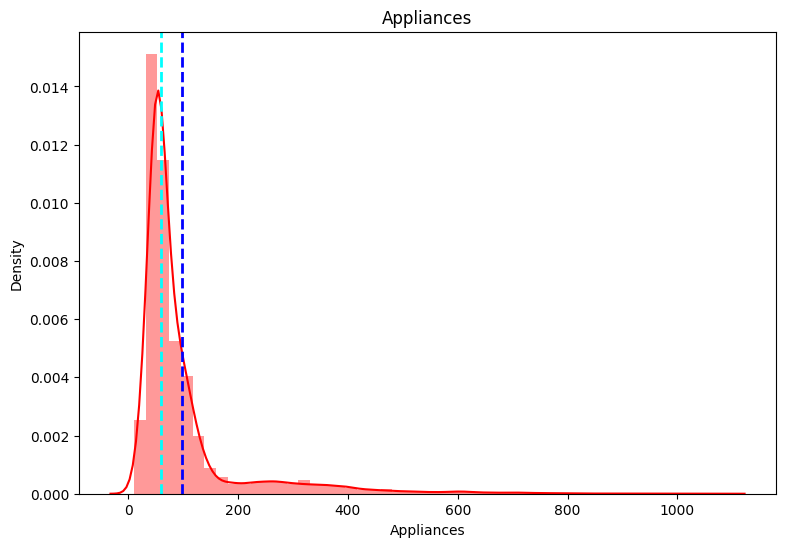

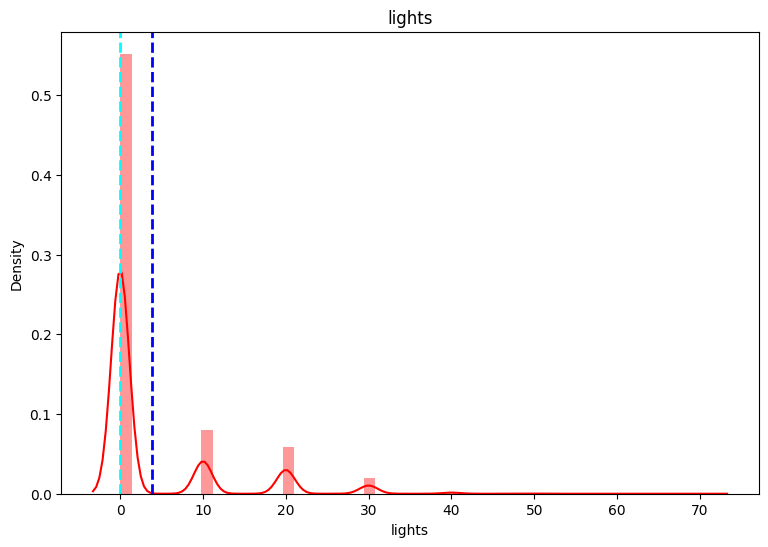

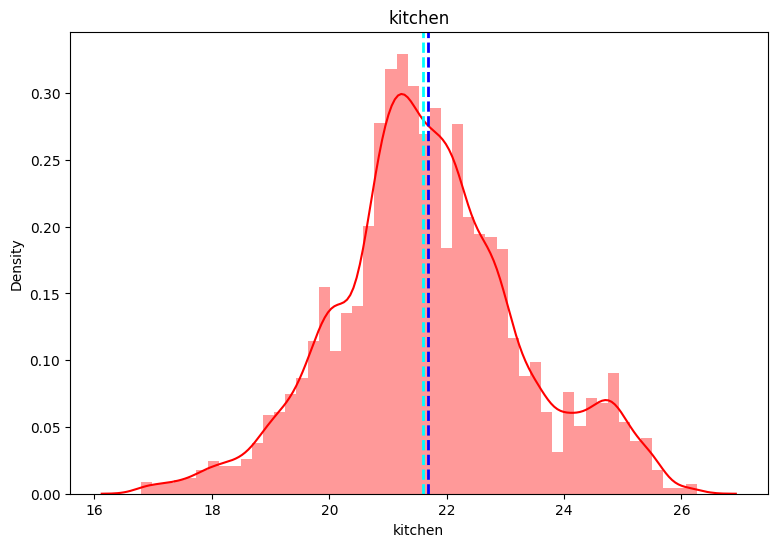

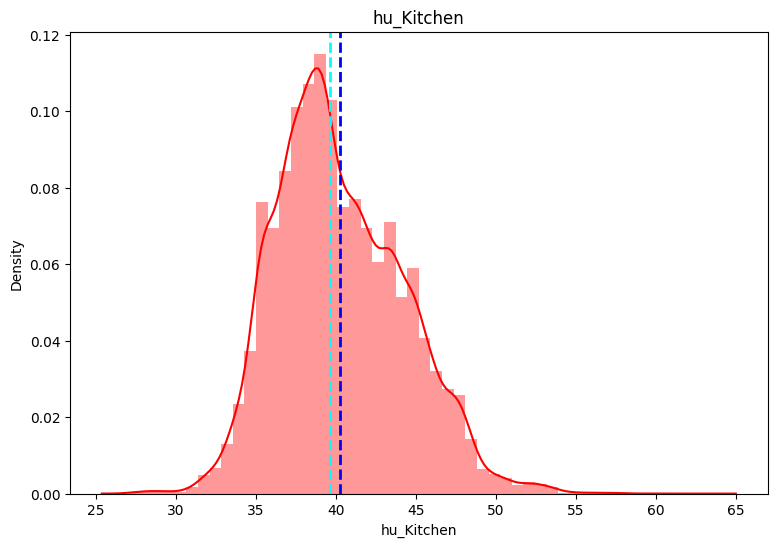

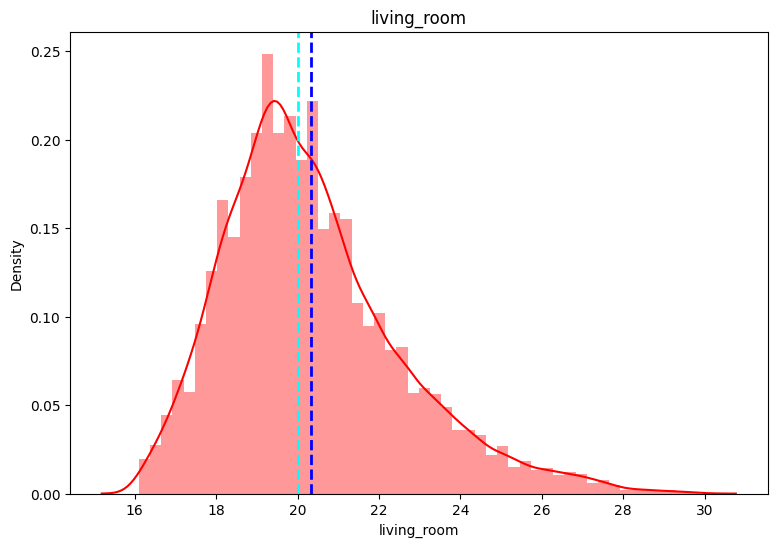

...

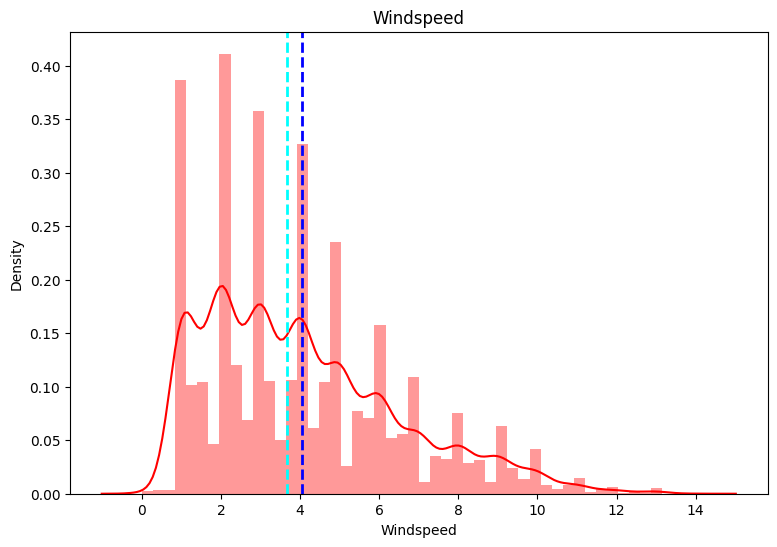

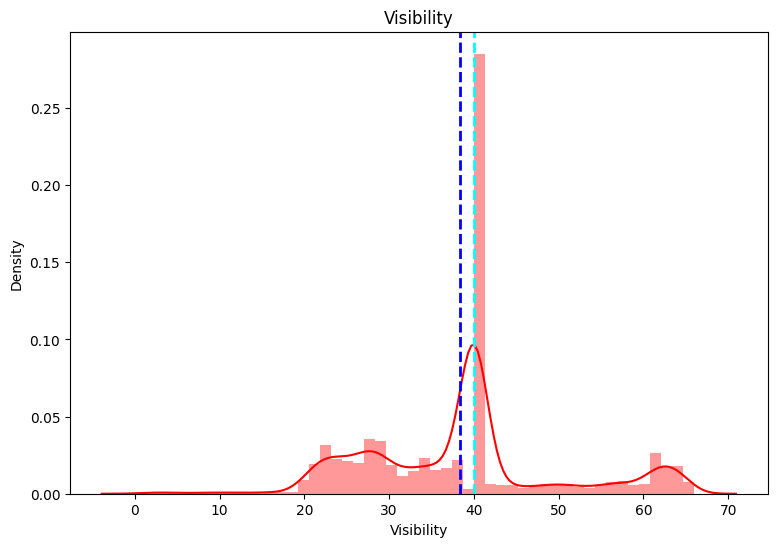

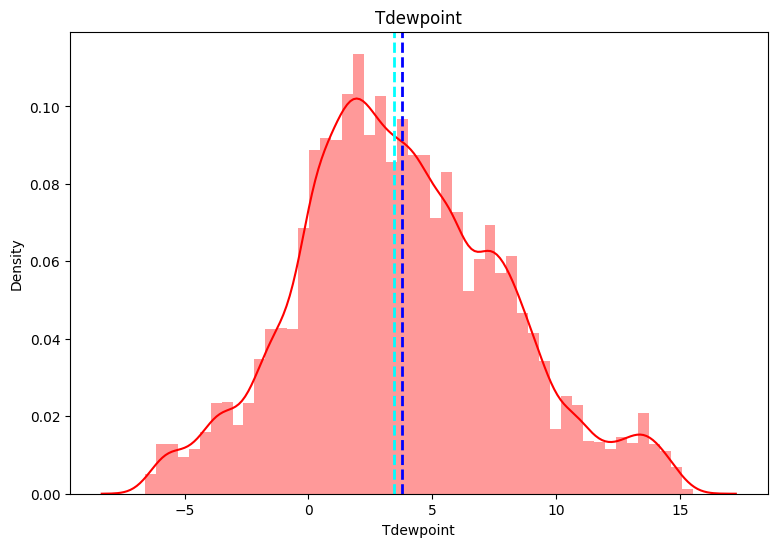

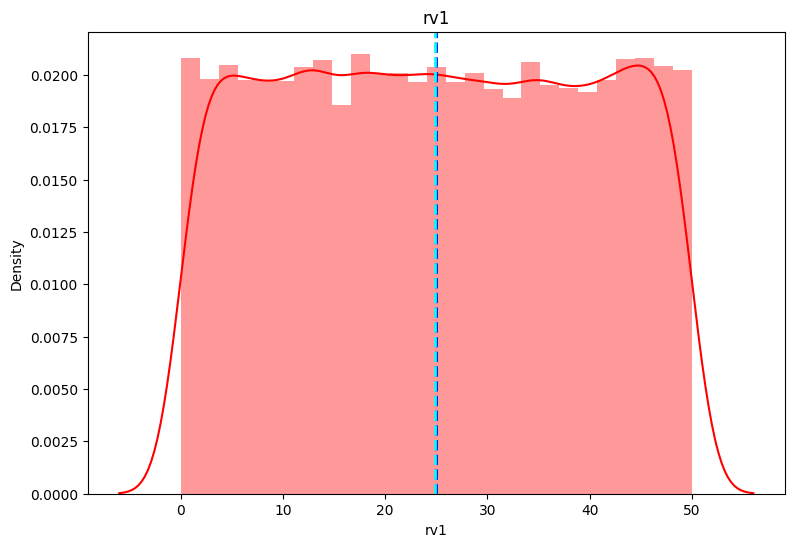

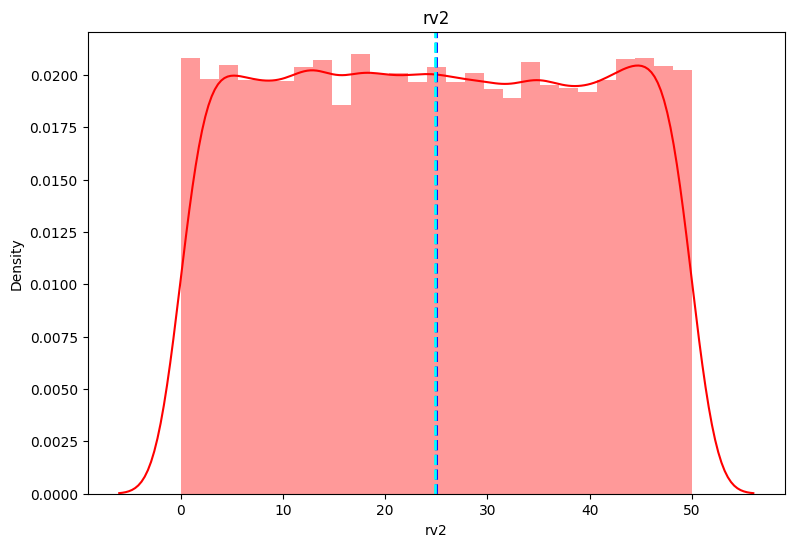

In [31]:
# Chart - 1 visualization code
for i in mean['features']:
  
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature= (first_df[i])
  sns.distplot(first_df[i],color = 'r')
  ax.axvline(feature.mean(),color='b', linestyle='dashed', linewidth=2)
  ax.axvline(feature.median(),color='cyan', linestyle='dashed', linewidth=2)
  ax.set_title(i)
 
  plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.
> **To check the distribution of the features, seaborn's distplot is the best choice. **

##### 2. What is/are the insight(s) found from the chart?

Answer Here
> **From the plot it has been found out that, some features are nearly normally distributed but some are filled with skewedness.**

> **Appliances,Lights,visibility and Windspeed are filled with skewdness, hence applying the transformation is required for them.**

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here
> **The insights will help to build the more accurate ML model.**

#### Chart - 2

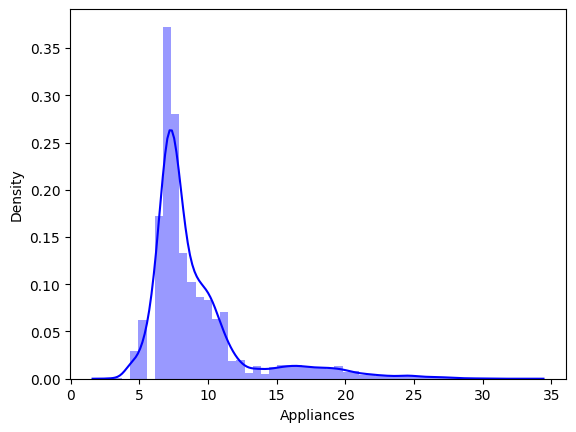

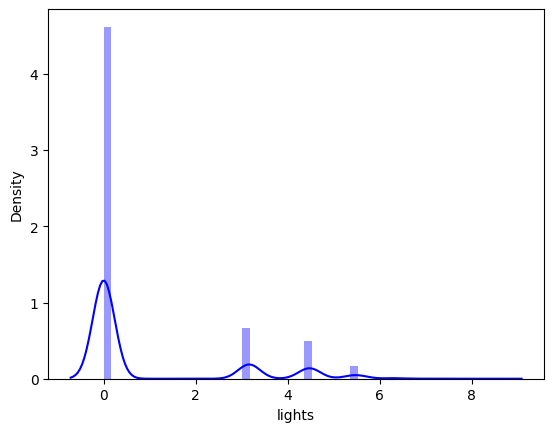

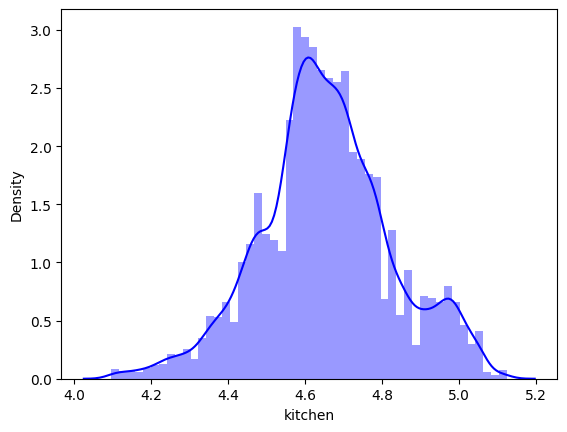

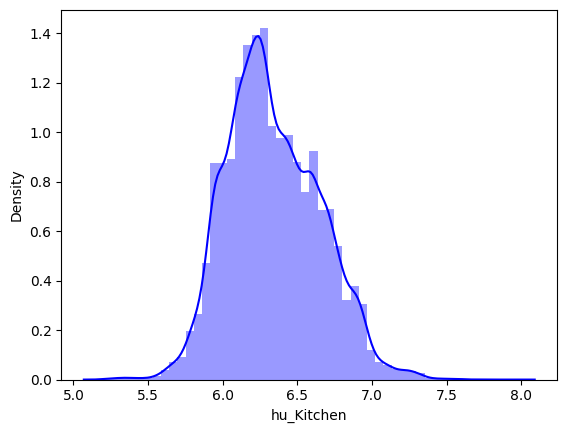

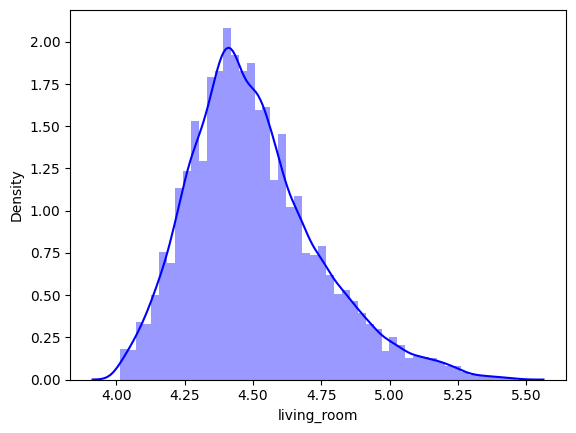

...

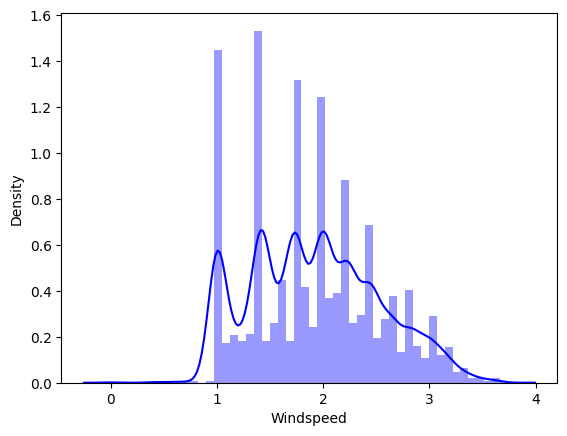

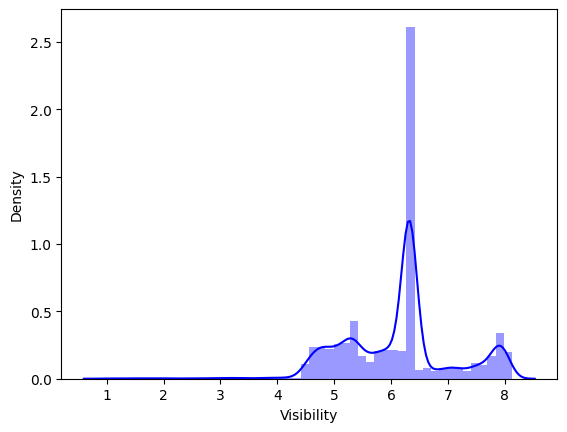

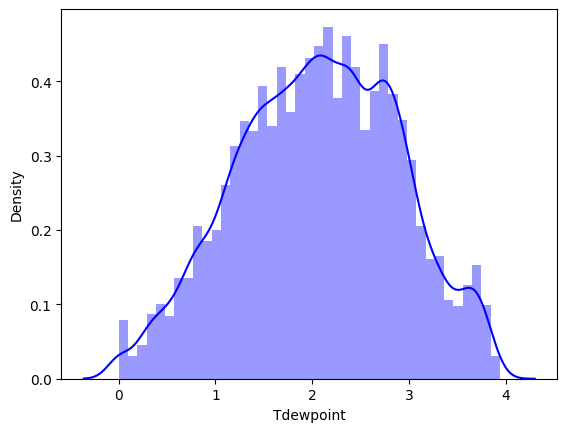

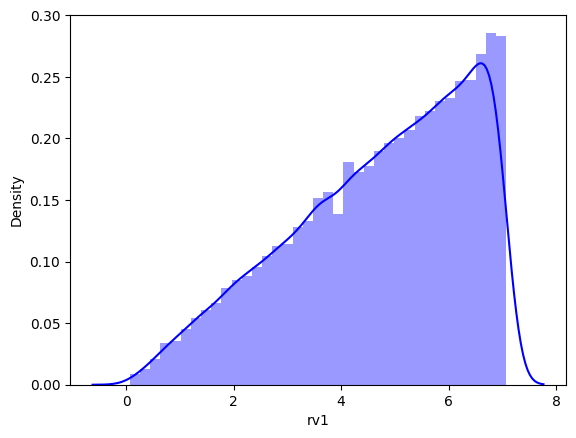

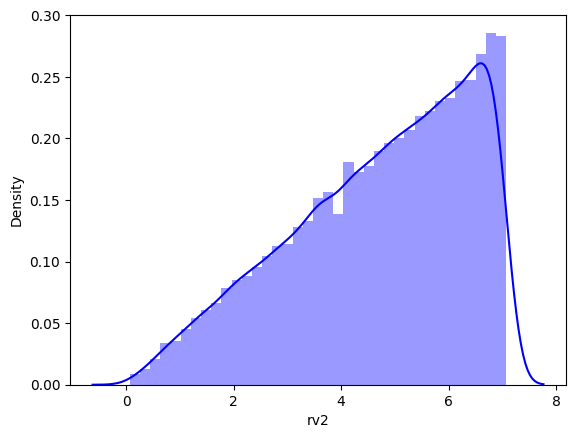

In [32]:
# Chart - 2 visualization code
for i in mean['features']:
  sns.distplot(np.sqrt(first_df[i]),color='b')
  plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.
> **In this chart transformation have been applied to move the features towards more normally distributed.**

##### 2. What is/are the insight(s) found from the chart?

Answer Here
> **Applying the transformation have reduced the skewedness in the features.**

> **More specifically due to uncompatibility of feature lights with  log transformation I have used the sqaure root transformation.**

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here
> **Square root transformation have reduced the skewedness and helped to buil more accurate regression model.**

#### Chart - 3

In [33]:
mean.iloc[21]

features    Press_mm_hg
mean         755.522602
Name: 21, dtype: object

In [34]:
# Chart - 3 visualization code
mean1=mean.copy().drop(21)
mean1

,features,mean
0,Appliances,97.694958
1,lights,3.801875
2,kitchen,21.686571
3,hu_Kitchen,40.259739
4,living_room,20.341219
5,hu_living,40.42042
6,Laundry_room,22.267611
7,hu_laundry,39.2425
8,office_room,20.855335
9,hu_office,39.026904


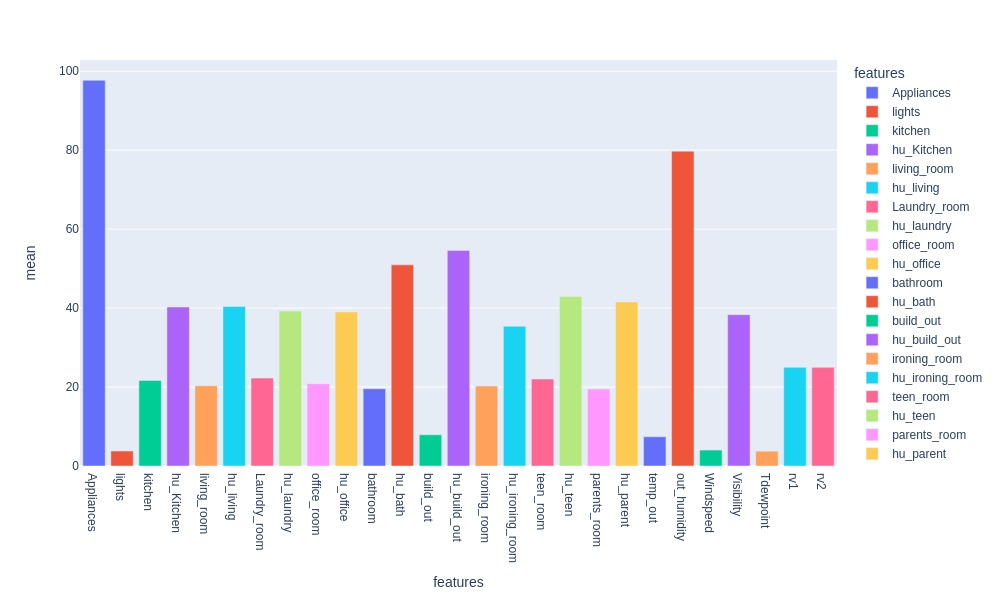

In [131]:
fig = px.bar(mean1, x='features', y='mean',color='features')
fig.update_layout(width=1000,height=600)
fig.show()

##### 1. Why did you pick the specific chart?

Answer Here.
> **Bar chart help to understand the trends of  multiple feature at once.**

##### 2. What is/are the insight(s) found from the chart?

Answer Here.
>**From the visualizaton graph, we can estimate the on an average range of temperature and humidity for all the features.**

>**In addition with it, other features like atmospheric pressure ,windspeed, tdewpoint also shows the average normal values.For e.g the mean of  atmospheric pressure is near about 756 atm, which is approximately equivalent to the noraml atmospheric pressure which is 760 atm.**

> **The datapoint showing the value for mean atm. pressure has been removed while plotting the bar chart because it is too high. Hence the plot was imbalanced and hence for simplicity of graph it has been removed.**

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here
> **It helps in understanding the standard normal values of all the features.**

#### Chart - 4

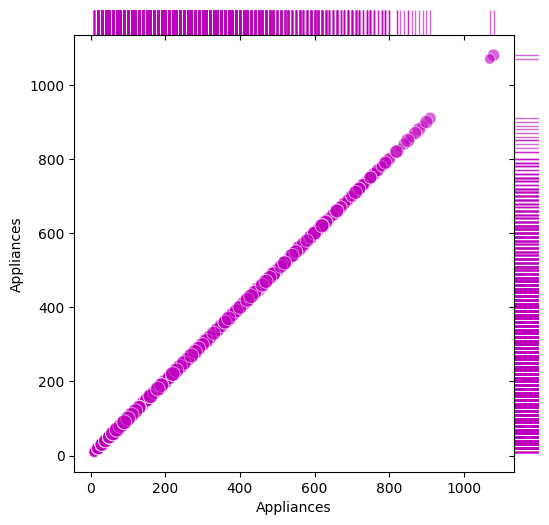

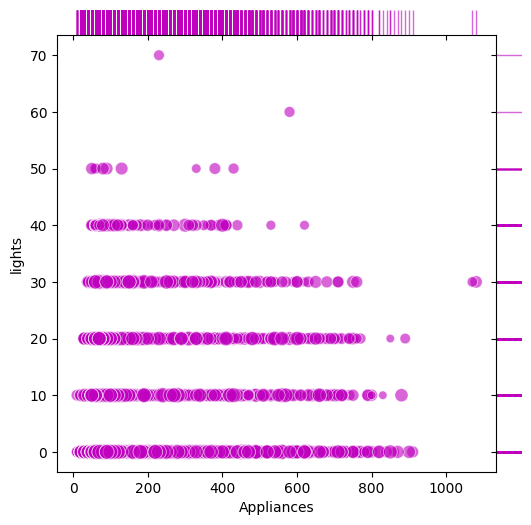

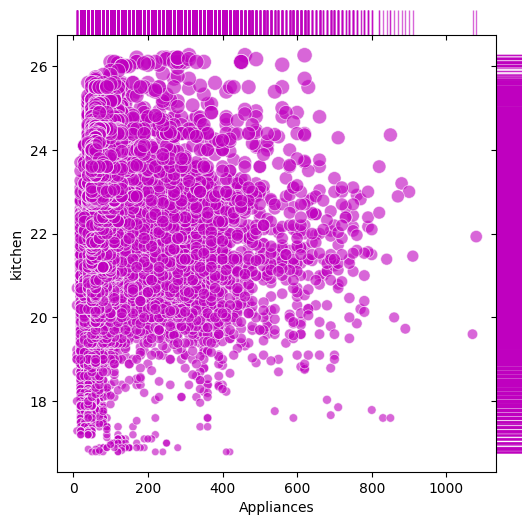

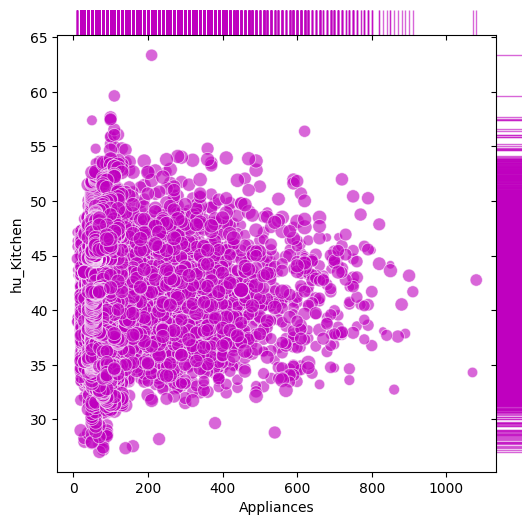

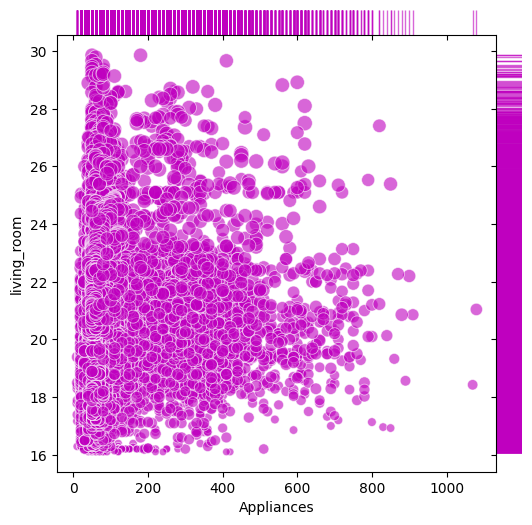

...

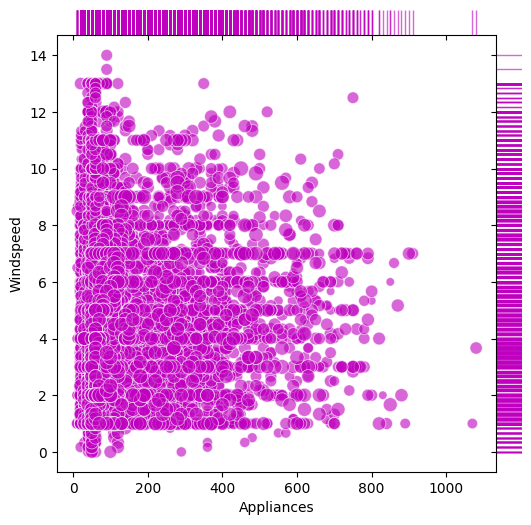

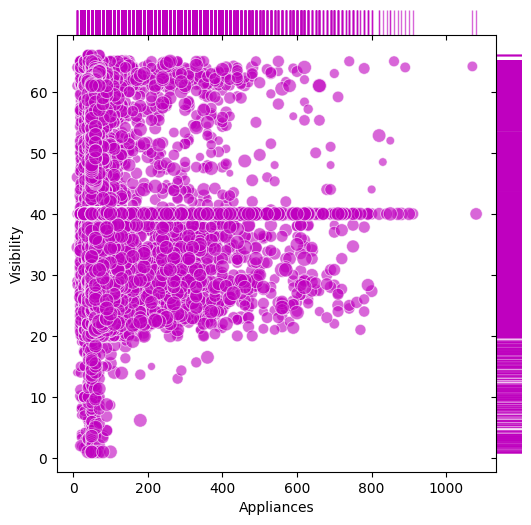

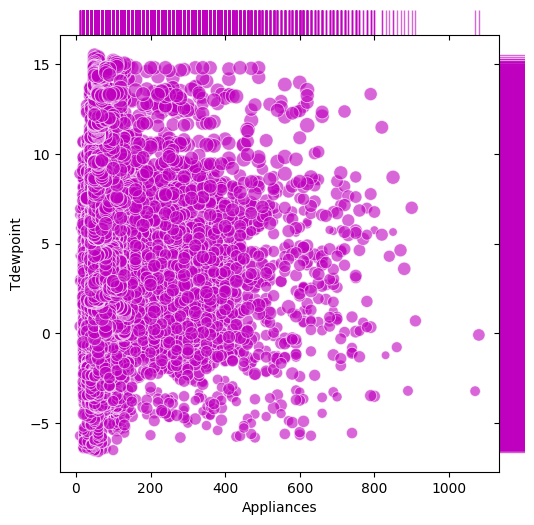

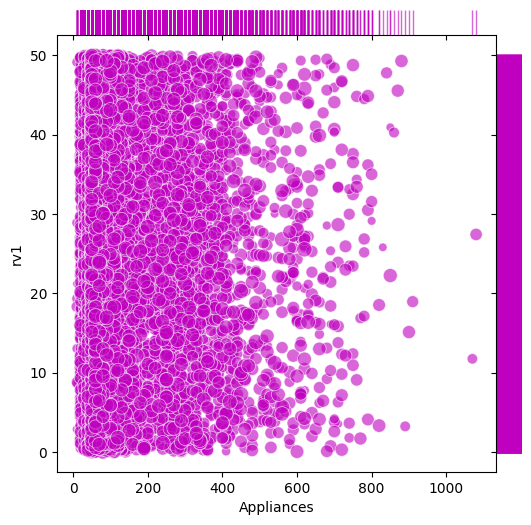

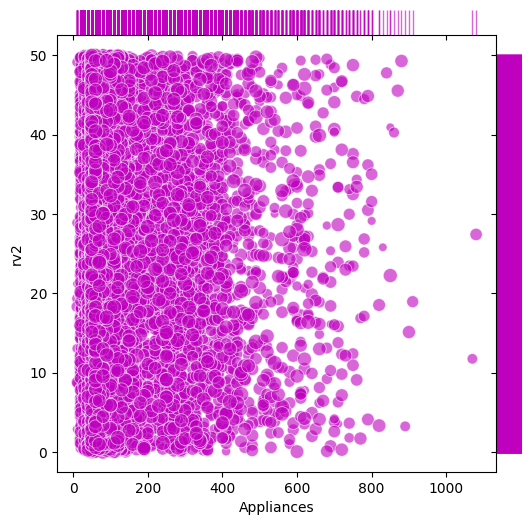

In [36]:
# Chart - 4 visualization code
for i in mean['features']:
  g = sns.JointGrid(data=first_df[mean['features']], x="Appliances", y=i, space=0, ratio=17)
  g.plot_joint(sns.scatterplot, size=first_df["kitchen"], sizes=(30, 120),
             color="m", alpha=.6, legend=False)
  g.plot_marginals(sns.rugplot, height=1, color="m", alpha=.6)

##### 1. Why did you pick the specific chart?

Answer Here.
> In the above plot, I have plotted evry feature with the target variable.
Here, the features are plotted against the 'Appliances' column. **bold text**

##### 2. What is/are the insight(s) found from the chart?

Answer Here
> **The graphs shows, arrangement of some features and appliances are very much neutral and purely scattered. But the Lights column is showing somewhat relationship with the target variable.**

> **Otherwise the arrangement of scatterpoints are compatible for regression analysis as it do not show any specific arrangement with the target variable.**

#### Chart - 5

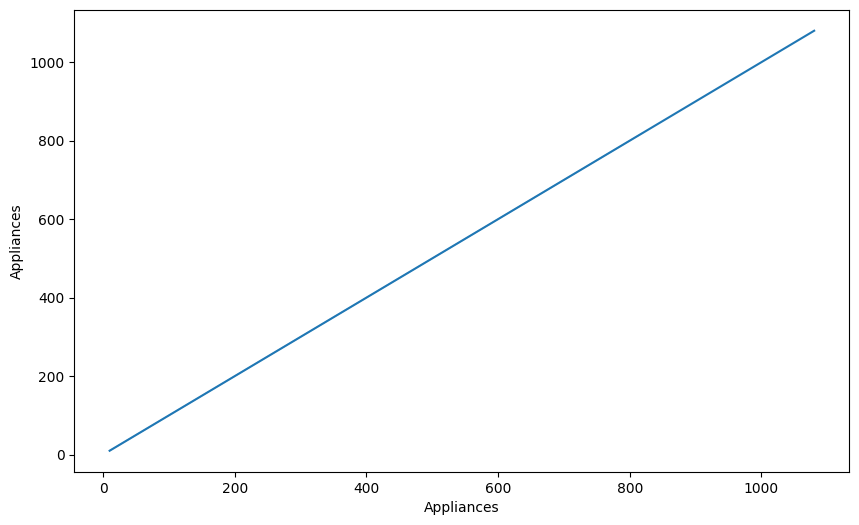

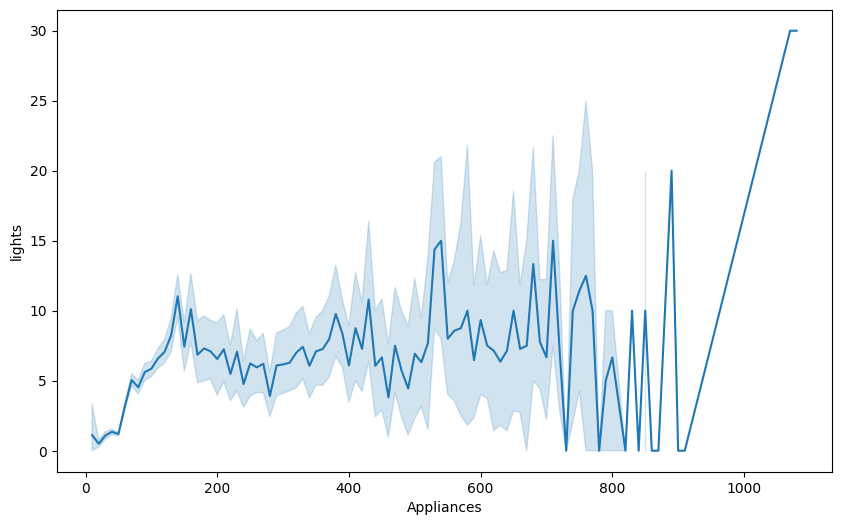

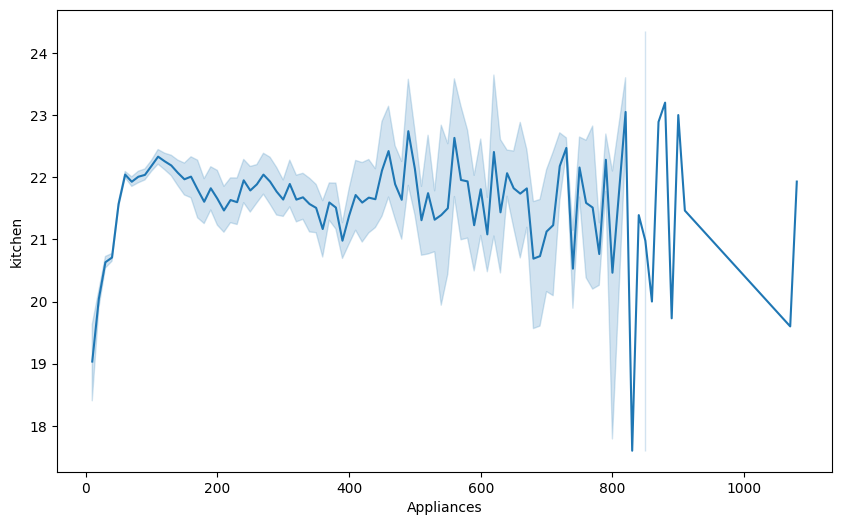

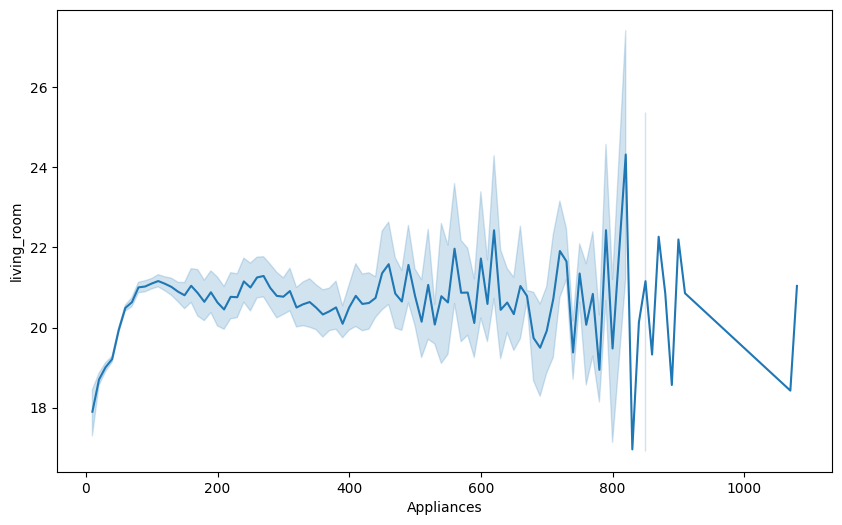

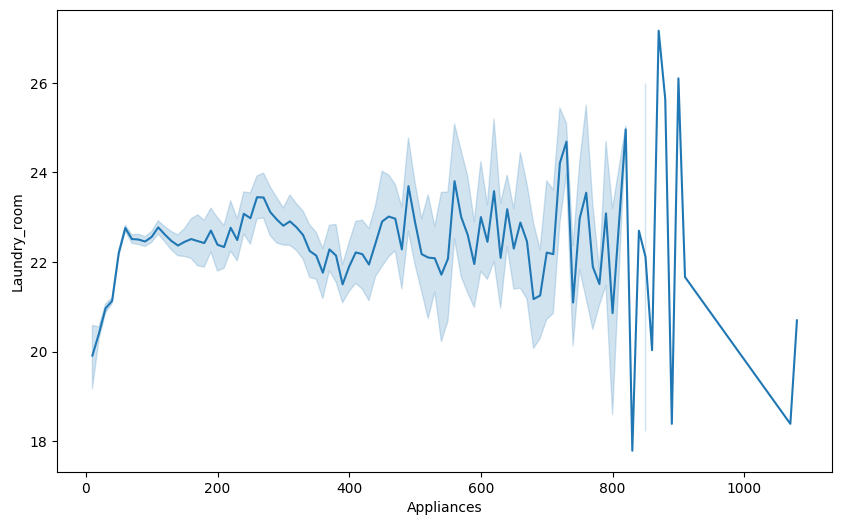

...

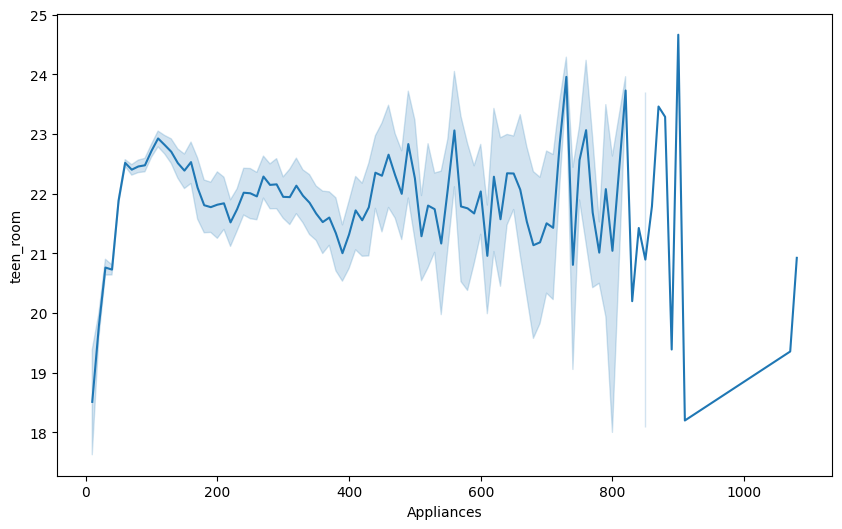

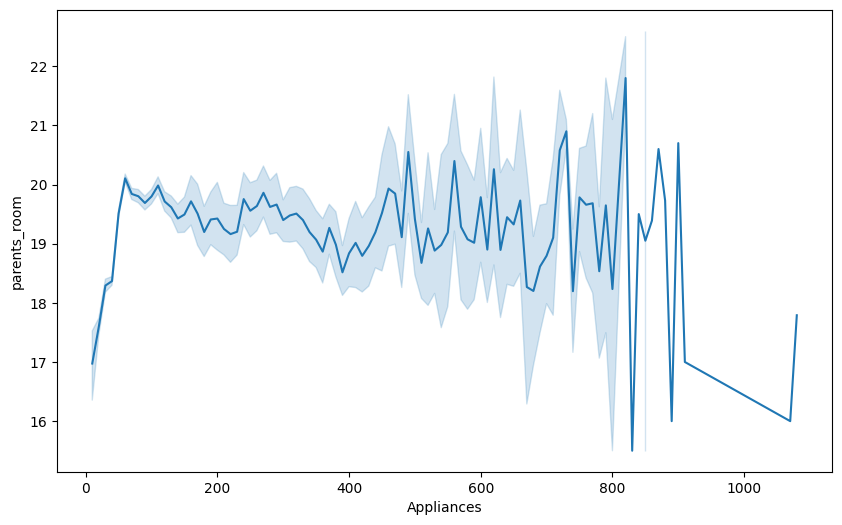

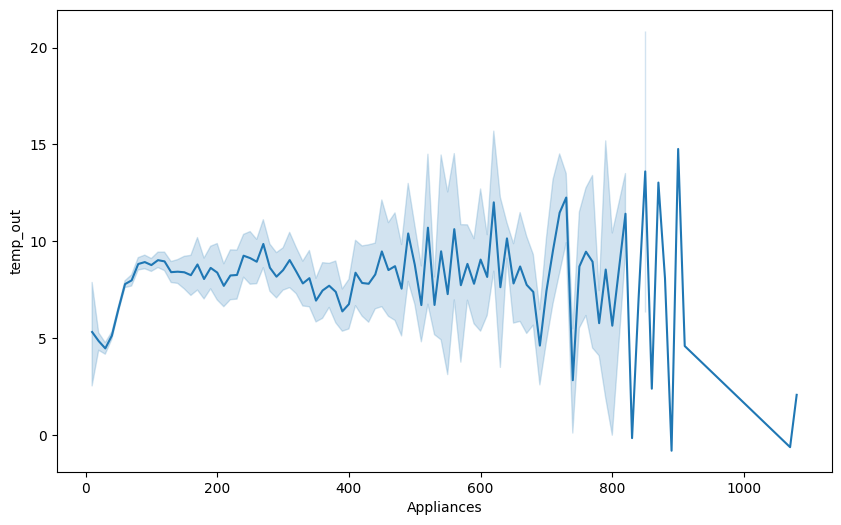

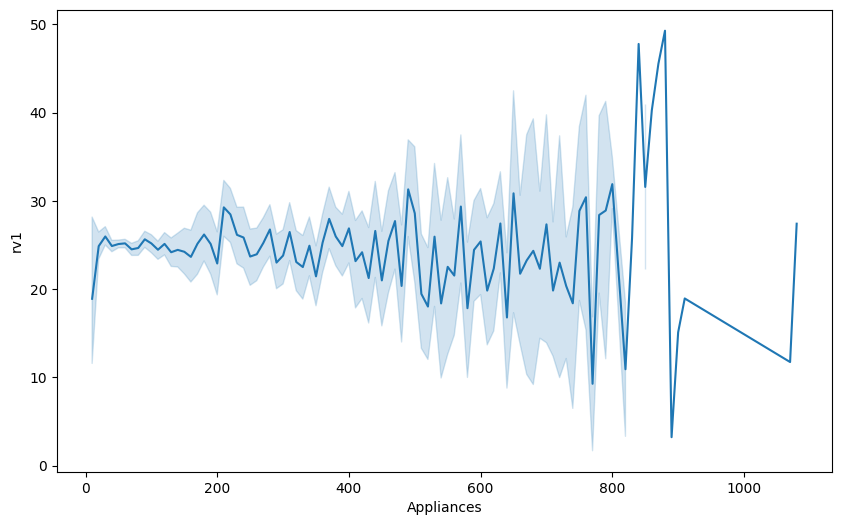

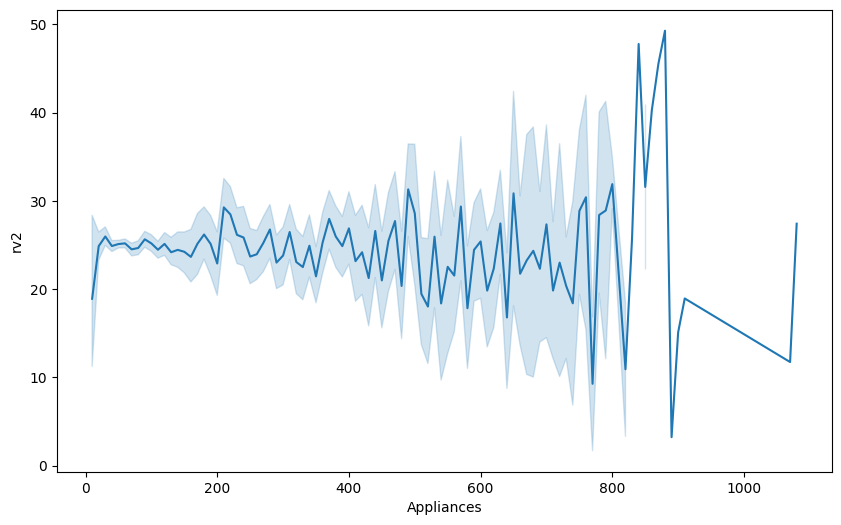

<Figure size 1000x600 with 0 Axes>

In [37]:
# Chart - 5 visualization code
plt.figure(figsize=(10,6))
for i in temp_df:
  sns.lineplot(x='Appliances', y=i,
             
             data=temp_df)
  
  plt.show()
  plt.figure(figsize=(10,6))

##### 1. Why did you pick the specific chart?

Answer Here.
> **Line plot is useful to detect any type of linearity in our features.**

##### 2. What is/are the insight(s) found from the chart?

Answer Here
> **The lines for near about all the columns shows the same pattern.**

> **It might be due to the same kind of realtionship of independent variables with target variable.**

> **If the trends with target variable is same for all the independent variable, then it could lead us towards multicolinearity.**

> **Think like if trends of target and independent variable is same for all the features, then all the independent features might share some kind of similarity, which we could refer as multicolinearity.**

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here
> **the graph inclining us towards some kind of similarity in independent variable.**

#### Chart - 6

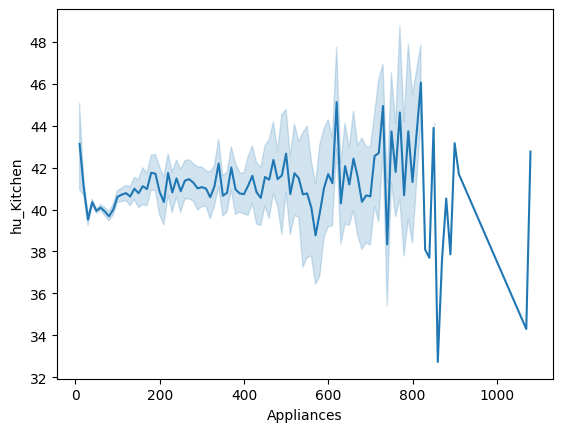

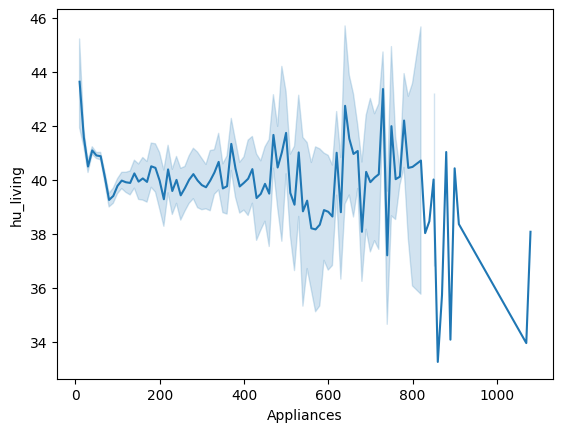

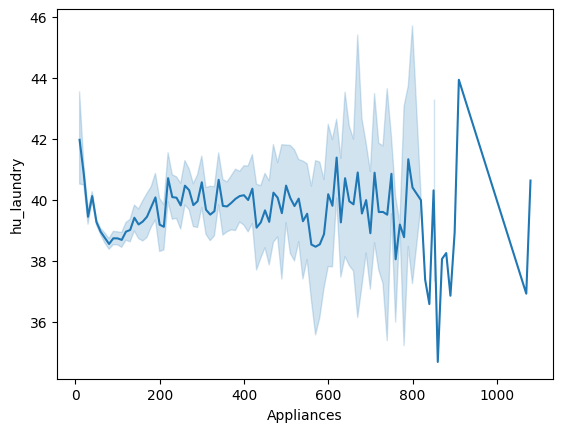

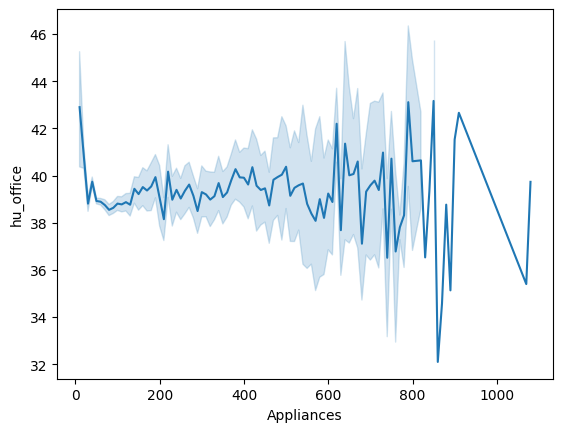

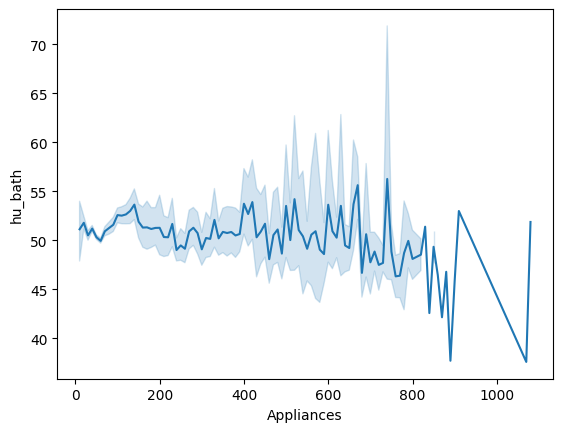

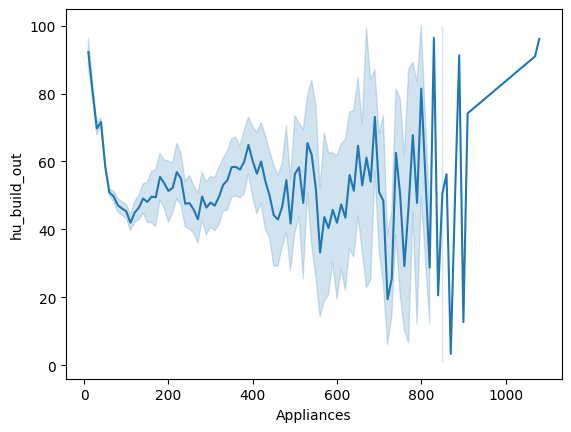

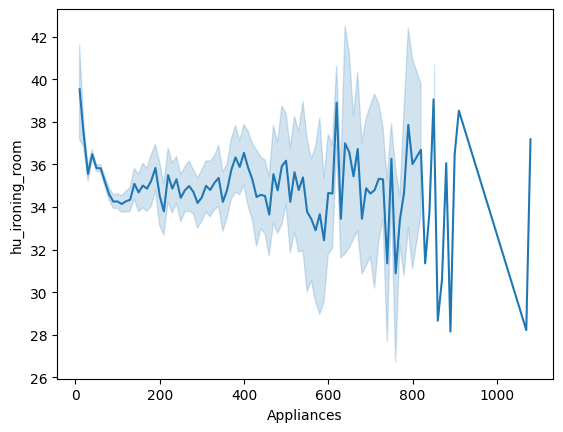

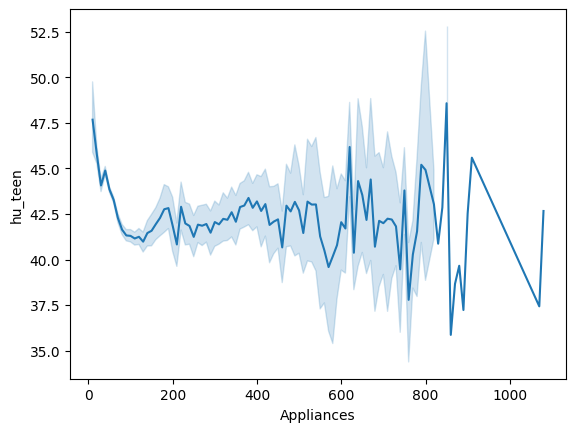

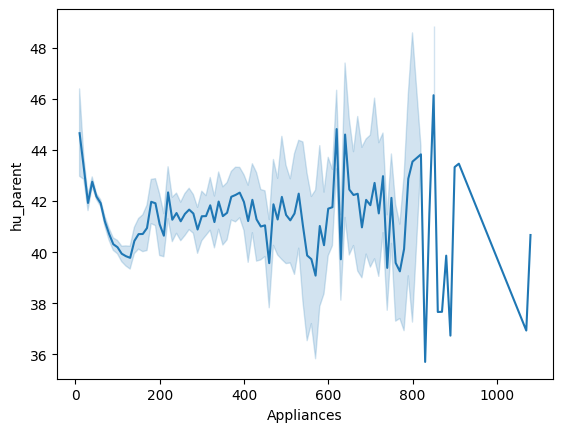

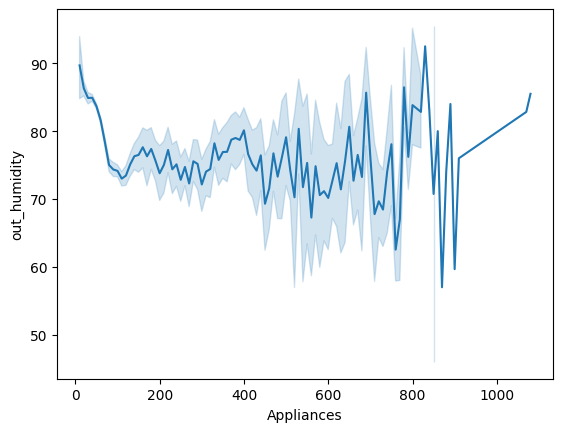

In [38]:
# Chart - 6 visualization code
humid_list=['hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','hu_build_out','hu_ironing_room','hu_teen','hu_parent','out_humidity']
for i in first_df[humid_list]:
  sns.lineplot(x="Appliances", y= i,
             data=first_df)
  plt.show()


**Now this graph is showing the same kind of trends. But this visualization is helping us for collecting information only for humidity related features.**

#### Chart - 7

In [39]:
from pylab import rcParams
rcParams['figure.figsize'] = 8, 8

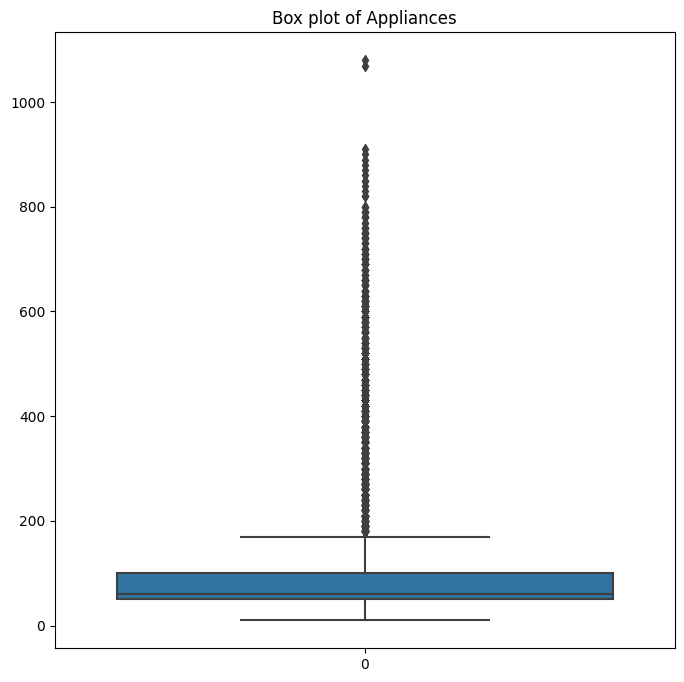

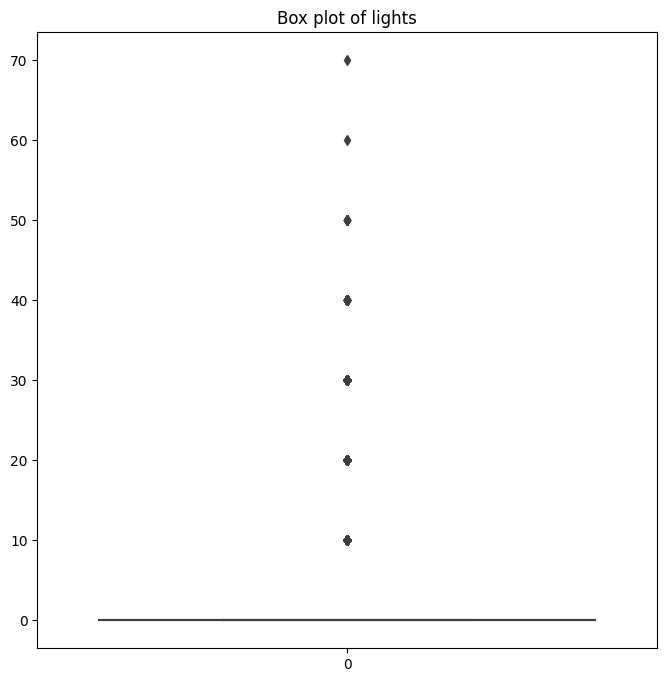

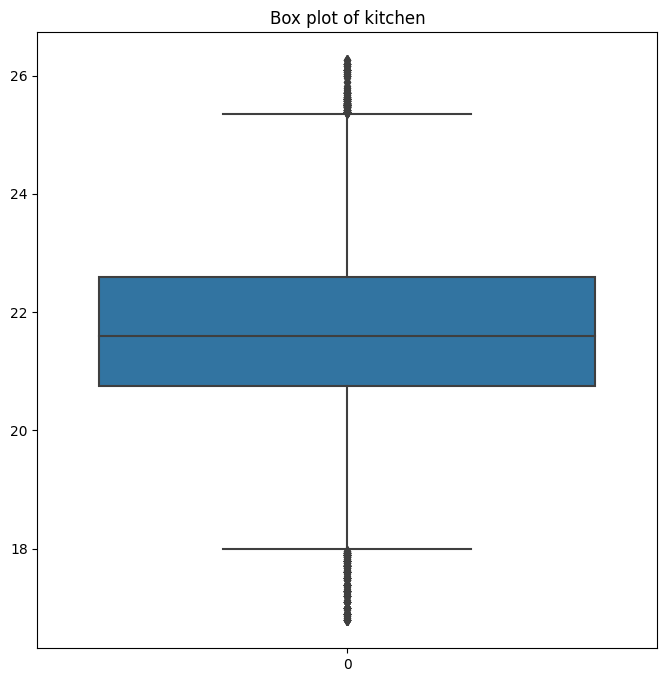

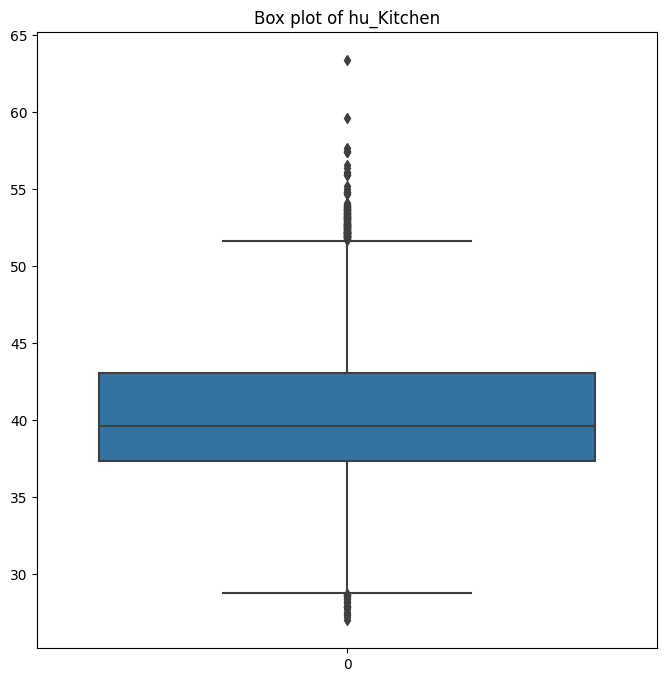

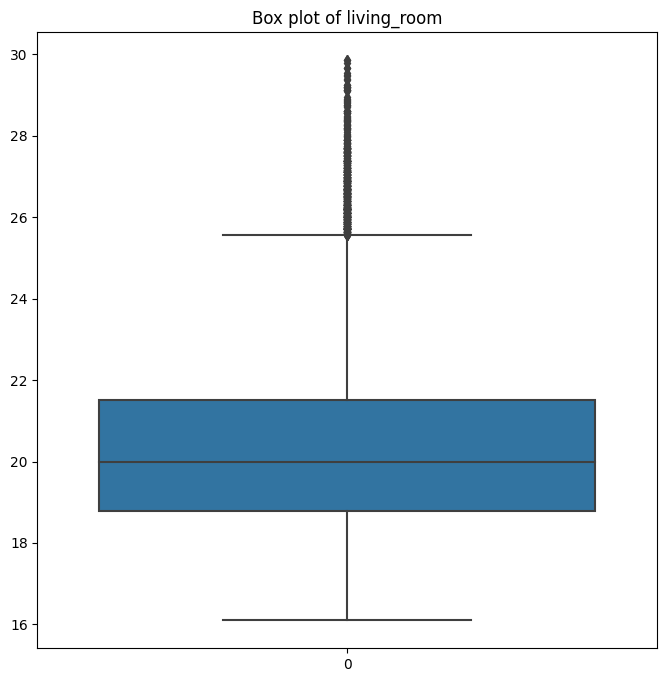

...

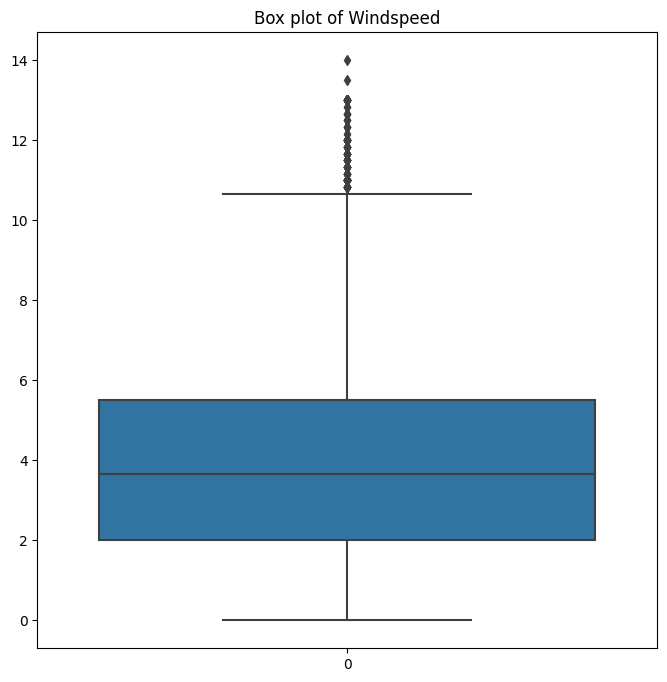

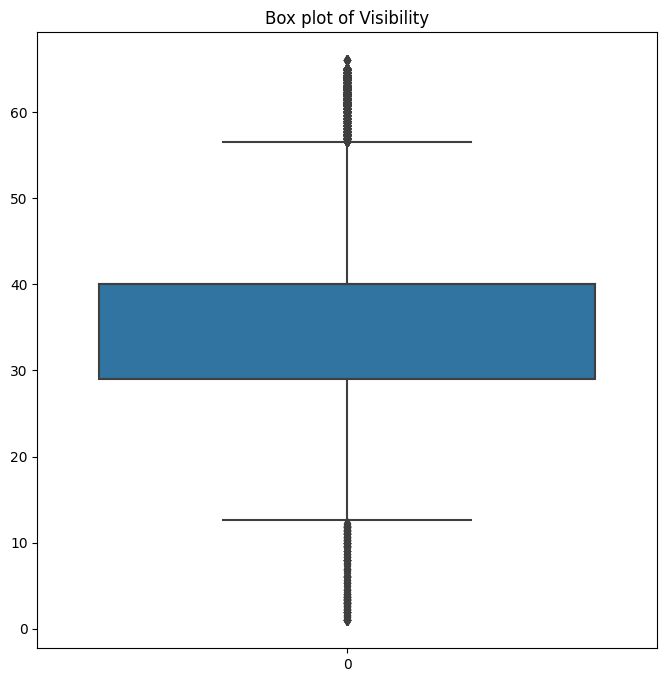

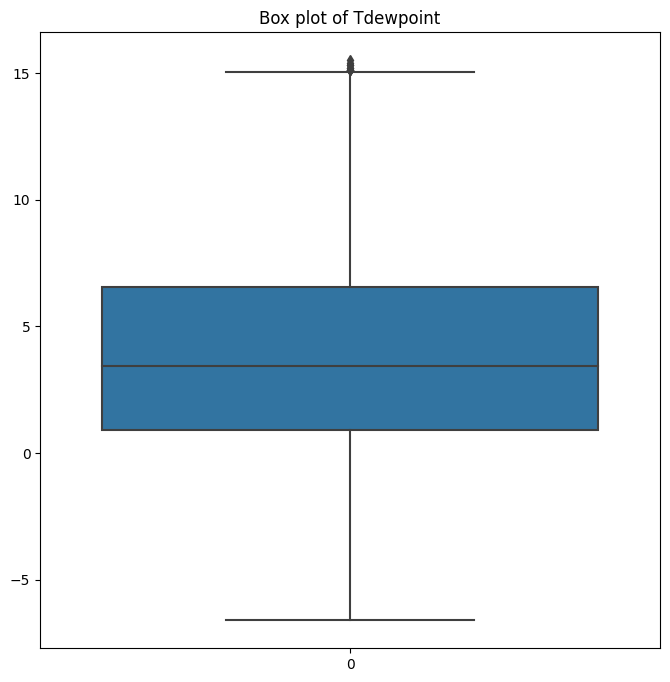

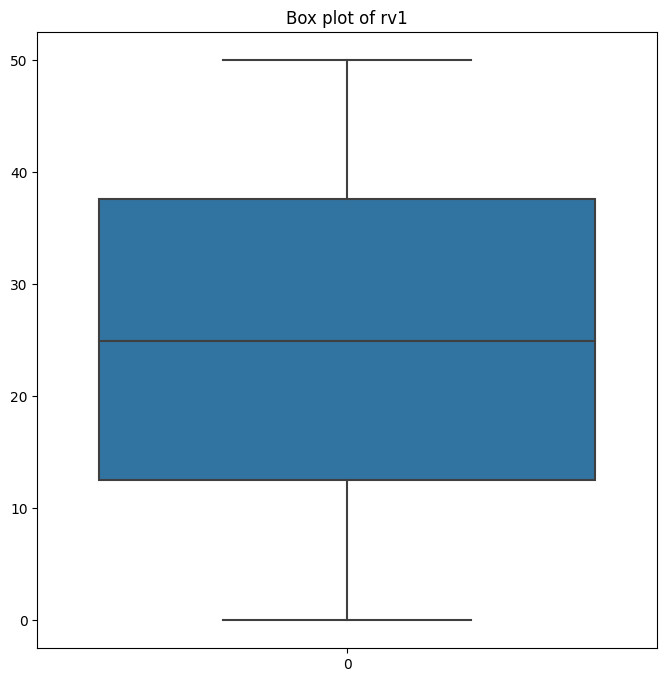

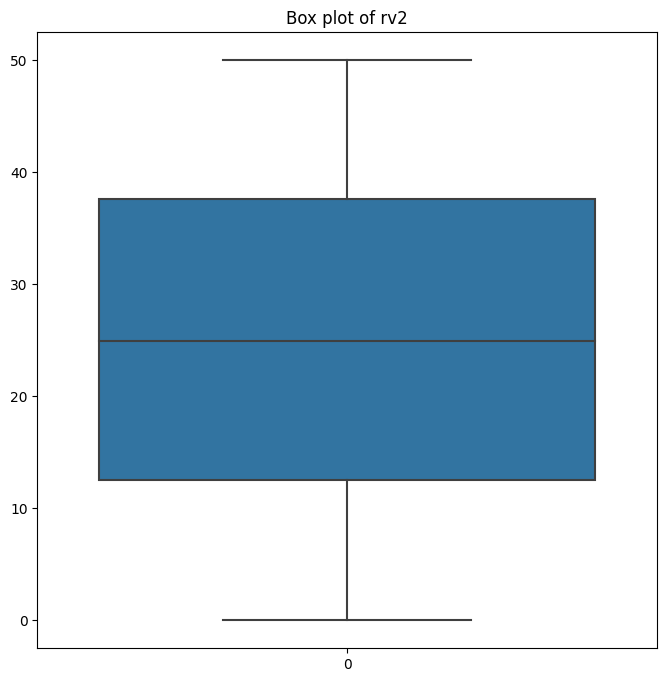

In [40]:
# Chart - 7 visualization code
for i in first_df[mean['features']].columns:
  box= first_df[i]
  sns.boxplot(box).set_title(f'Box plot of {i}')
  plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.
> **The boxplot is excellent choice for considering the overview of outliers.**

##### 2. What is/are the insight(s) found from the chart?

Answer Here
> **Despite lacking in a clear picture, our boxplot is showing us a glimpse of outliers present in the respective features.**

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here
> **yess for treating the oultiers.**

#### Chart - 8

In [41]:
month_df

,month_name,Appliances
0,April,427200
1,February,421550
2,January,283510
3,March,432800
4,May,362950


In [42]:
import plotly.graph_objects as go

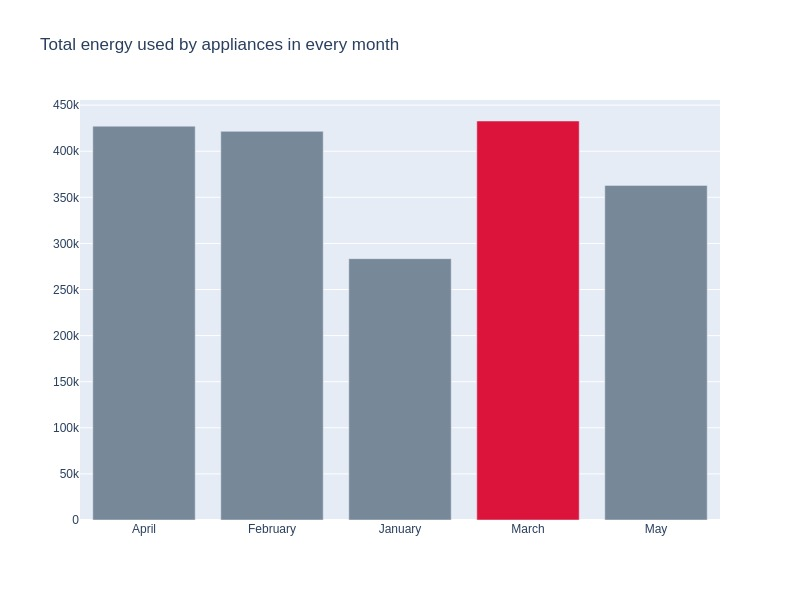

In [132]:
# Chart - 8 visualization code

colors = ['lightslategray',] * 5
colors[3] = 'crimson'

fig = go.Figure(data=[go.Bar(
    x=month_df['month_name'],
    y=month_df['Appliances'],
    marker_color=colors # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Total energy used by appliances in every month')
fig.update_layout(width=800,height=600)
fig.show()

##### 1. Why did you pick the specific chart?

Answer Here.
>**TO highlight the exact month where the energy is consumed highest.**

##### 2. What is/are the insight(s) found from the chart?

Answer Here
The hidden insights are itself found out from the dataframe, where we could understand the maximum consumption happened in **MARCH**

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here
> **The gain insights would help countries to monitor exactly when the energy consumption is highest.**

#### Chart - 9

In [44]:
day_df

,month_name,day,Appliances
0,April,1,8580
1,April,2,7300
2,April,3,10340
3,April,4,27150
4,April,5,22300
...,...,...,...
133,May,23,11960
134,May,24,13850
135,May,25,12080
136,May,26,21170


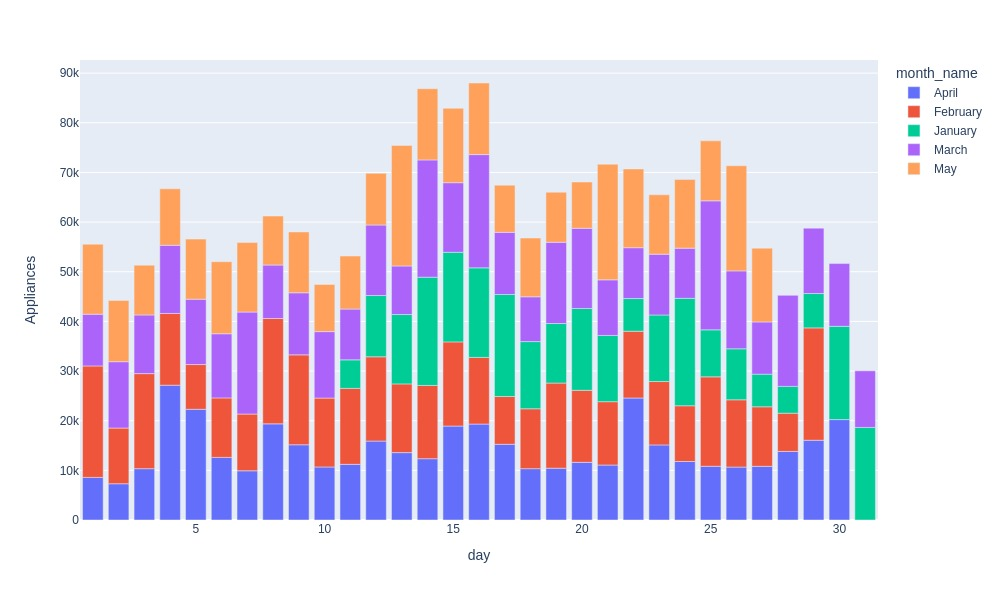

In [134]:
# Chart - 9 visualization code
fig = px.bar(day_df, x="day", y="Appliances",
             
             color="month_name",barmode="relative")
fig.update_layout(width=1000,height=600)
fig.show()

##### 1. Why did you pick the specific chart?


> **it shows the colorful variation of all the days in five months.**

##### 2. What is/are the insight(s) found from the chart?


> **The month of April shows highest energy consumption on the 4th day of the month.**

> **Whereas on 28th of january has minimum energy consumption by appliances.**

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.


> **By understanding the day wise energy consumption, the companies could understand the exact behavioural pattern of their consumers.**



#### Chart - 10

In [46]:
# Chart - 10 visualization code
hour_df.head()

,hour,Appliances
0,0,43390
1,1,42190
2,2,40340
3,3,39650
4,4,40570


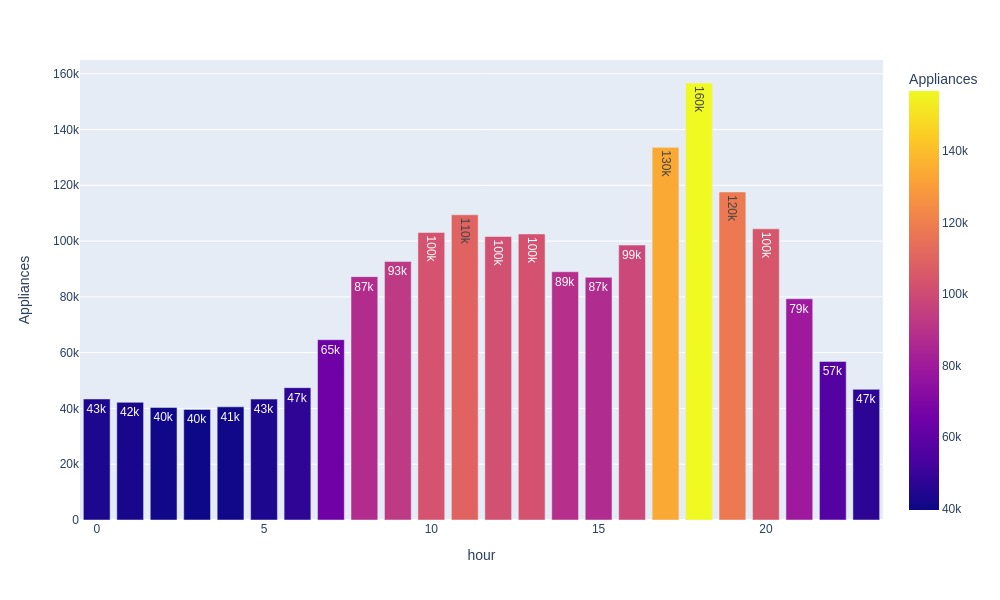

In [138]:
fig = px.bar(hour_df, text_auto='.2s', x='hour', y='Appliances',color='Appliances')
fig.update_layout(width=1000,height=600)
fig.show()

##### 1. Why did you pick the specific chart?

> **The graph beautifully shows the yellow color for the time when highest energy have consumed.**

##### 2. What is/are the insight(s) found from the chart?

**At 6 'o' clock evening the energy consumption by Appliances is maximum. It is very obvious that we all use high amount of energy in the evening only.**

#### Chart - 11

In [48]:
# Chart - 11 visualization code
week_df=week_df.reset_index()
week_df

,weekday,Appliances
0,Friday,297650
1,Monday,309610
2,Saturday,290690
3,Sunday,259690
4,Thursday,260450
5,Tuesday,250920
6,Wednesday,259000


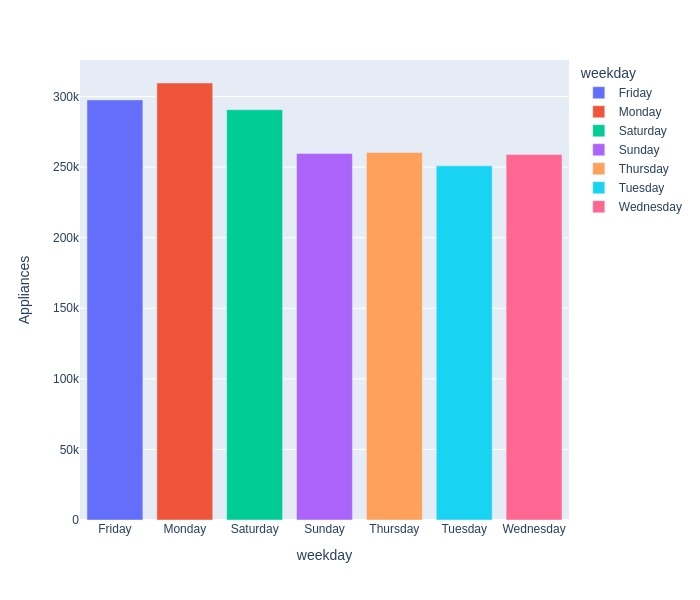

In [139]:
fig=px.bar(week_df,x='weekday',y='Appliances',color='weekday')
fig.update_layout(width=700,height=600)
fig.show()

##### 1. Why did you pick the specific chart?

**It shows the charts very ornamentally**

##### 2. What is/are the insight(s) found from the chart?

**As we know Saturday is weekend and Monday is the start of week, very obviously the energy consumption will be high on these days.**

#### Chart - 12 - Correlation Heatmap

<Axes: >

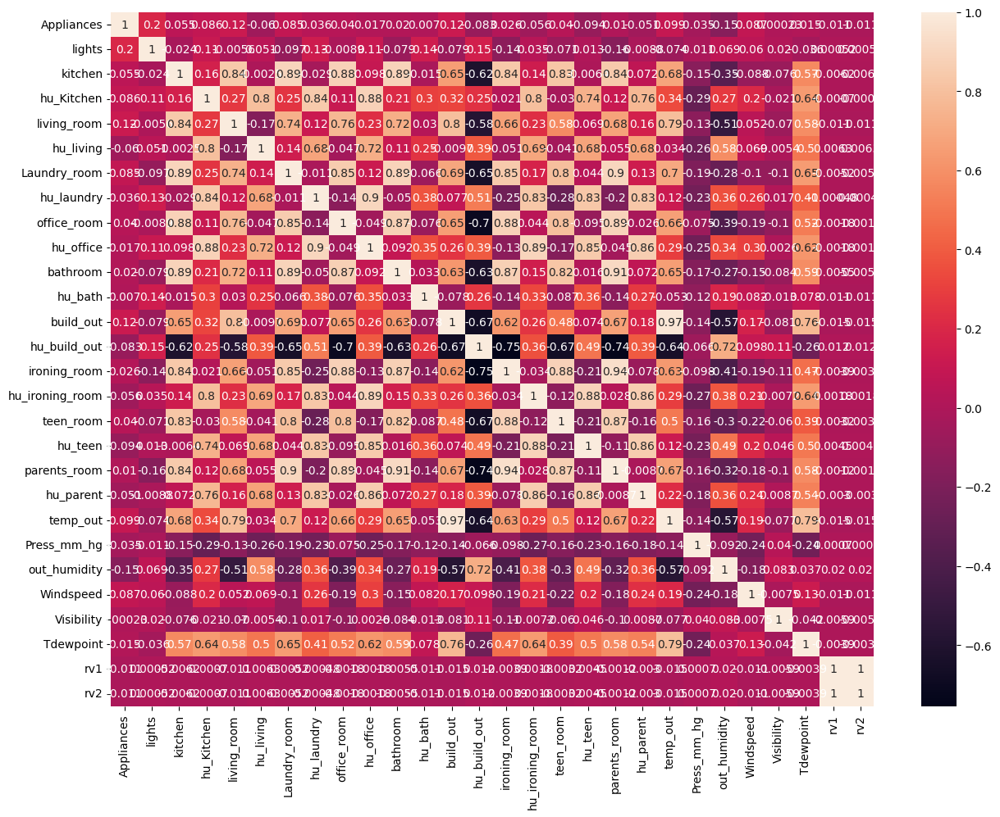

In [50]:
# Correlation Heatmap visualization code
plt.figure(figsize=(15,11))
corr=first_df[first_df[mean['features']].columns].corr()
sns.heatmap(corr,annot=True)

##### 1. Why did you pick the specific chart?


> **to find out the in depth correlation between all the feautres.**

##### 2. What is/are the insight(s) found from the chart?

**Graph shows there is very high correlation in between all the features.**

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.


> I want to check how much percentage of Appliances in this four months have consumed greater than the mean energy consumption.

> So my **Null hypothesis** is 50 % or more of Appliances have consumed more than or equal to mean of total energy consumption.

> **Alternate Hypothesis** is, Not more than 50% of Appliances consumed the greater energy than its mean.

    P --> Proportions of Appliances
    H0: P >= 50
    HA: P <= 50







#### 2. Perform an appropriate statistical test.

In [51]:
# Perform Statistical Test to obtain P-Value
''' For analysing the Null Hypothesis I am using the Proportion method.
    As the H0 is asking for 50% or more proportion of appliances energy consumption
    is more than its mean, we will require to extract a random sample and perform the testing.'''
    
'''first step, extracting the Dataset'''
appliance_rand= first_df['Appliances'].sample(1000) 

'''As we require to work on mean'''
appliance_rand_mean= appliance_rand.mean()
appliance_rand_mean

'''Now we require to find out the existing proportion in our random sample.
   Proportion of such entries where Appliances have consumed more energy than its mean'''

more_mean=[]
for i in appliance_rand:
  if i > appliance_rand_mean:
    more_mean.append(i)
P = (len(more_mean)/len(appliance_rand))
print(P)
'''Now this is the proportion of random sample, shows proportion of appliances where energy consumption is more than mean.'''

0.243


'Now this is the proportion of random sample, shows proportion of appliances where energy consumption is more than mean.'

In [52]:
''' As our Null Hypothesis asking for 50% of entries, Our proportion for population will be 50'''

P_popu = 0.5   #proportion for population
N = len(appliance_rand)
Z_score = P-P_popu/np.sqrt(P*(1-P)/N)
print(f'Z_score is {Z_score}')

P_Value= norm.cdf(Z_score,0,1)
print(f'P_value is {P_Value}')

if P_Value > 0.05:
  print('Null Hypothesis can not be rejected as P_value is greater than significance level of 0.05 .')
else :
  print('Null Hypothesis can be rejected as P_value is lower than significance level of 0.05 .')

Z_score is -36.622398073466016
P_value is 6.294361563128088e-294
Null Hypothesis can be rejected as P_value is lower than significance level of 0.05 .


In [53]:
#Cross evaluating the Null Hypothesis
'''Now if we calculate the proportion directly from our population then we could find the following results.'''

more_mean=[]
for i in first_df['Appliances']:
  if i > first_df['Appliances'].mean():
    more_mean.append(i)
P = (len(more_mean)/len(first_df['Appliances']))
print(P)
if P> 0.5 :
  print( 'The proportion of datapoints which consume more energy than its mean is more than 50%.')
else :
  print( 'The proportion of datapoints which consume more energy than its mean is less than 50%.')

0.2640486445401571
The proportion of datapoints which consume more energy than its mean is less than 50%.


##### Which statistical test have you done to obtain P-Value?

Answer Here.


> I have calculated the Z statistics for given proportion, and then find its P_value, by using normal cumulative distribution function with the mean and standard deviation of random sample.

> The significance level is 0.05




##### Why did you choose the specific statistical test?

Answer Here.
Z statistics gives the exact values for evealuating the hypothesis. It can be easily compared with its critical values.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.


> The second Hypothesis for Temperature in Kitchen.
Null Hypothesis says the mean temperature in kitchen is greater than normal room temperature.



> Alternate hypothesis says the temperature in Kitchen is at max room temperature and it can not be above it.

    R --> Normal room temperature
    T --> Mean of Kitchen temperature
    H0: T > R
    HA: T <= R


#### 2. Perform an appropriate statistical test.

In [54]:
# Perform Statistical Test to obtain P-Value

''' For analysing the Null Hypothesis I am using the mean method.
    As the H0 is asking, whether the mean temperature of kitchen is more than 
    Normal room temperature or not, we will perform the test on random samples.
    As the samples should be random always I am not using seed here. So the hypothesis could
    evaluate different samples everytime.'''
    
'''first step, extracting the Dataset'''
kitchen_rand= first_df['kitchen'].sample(1000) 

'''As we require to work on mean'''
kitchen_rand_mean= kitchen_rand.mean()
print(kitchen_rand_mean)
'''Following would be the mean of random samples.'''

21.644973043290044


'Following would be the mean of random samples.'

In [55]:
''' The mean and Normal room temperature has to be tested via Z_statistic'''

NRT = 20 #Normal room temperature

std_popu = first_df['kitchen'].std()# the standard deviation for population

deno= std_popu/np.sqrt(1000)  # This is the denominator part of final formula. I calculated here for easy execution.

Z_stat = ((kitchen_rand_mean - NRT)/(std_popu/np.sqrt(N)))
print(f'Z_score is {Z_stat} ')

P_value2=norm.cdf(Z_stat,0,1)
print(f'P_value is {P_value2} ')

if P_value2 > 0.05:
  print('The Null Hypothesis can not be rejected')
else:
  print('The Null Hypohesis can be rejected')

Z_score is 32.38884738723034 
P_value is 1.0 
The Null Hypothesis can not be rejected


##### Which statistical test have you done to obtain P-Value?


**I have calculated the Z statistics for given proportion, and then find its P_value, by using normal cumulative distribution function with the mean and standard deviation of random sample.**

**The significance level is 0.05**

##### Why did you choose the specific statistical test?


**Z statistics gives the exact values for evealuating the hypothesis. It can be easily compared with its critical values.**


## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [56]:
# Handling Missing Values & Missing Value Imputation
for i in first_df.columns:
  null=first_df[i].isnull().sum()
  print(f'The null values in {i} is {null} ')

The null values in date is 0 
The null values in Appliances is 0 
The null values in lights is 0 
The null values in kitchen is 0 
The null values in hu_Kitchen is 0 
The null values in living_room is 0 
The null values in hu_living is 0 
The null values in Laundry_room is 0 
The null values in hu_laundry is 0 
The null values in office_room is 0 
The null values in hu_office is 0 
The null values in bathroom is 0 
The null values in hu_bath is 0 
The null values in build_out is 0 
The null values in hu_build_out is 0 
The null values in ironing_room is 0 
The null values in hu_ironing_room is 0 
The null values in teen_room is 0 
The null values in hu_teen is 0 
The null values in parents_room is 0 
The null values in hu_parent is 0 
The null values in temp_out is 0 
The null values in Press_mm_hg is 0 
The null values in out_humidity is 0 
The null values in Windspeed is 0 
The null values in Visibility is 0 
The null values in Tdewpoint is 0 
The null values in rv1 is 0 
The null va

#### What all missing value imputation techniques have you used and why did you use those techniques?

Answer Here.
As there is no null values in all the columns, I haven't use any technique.

### 2. Handling Outliers

In [57]:
columns=[i for i in first_df.columns if i not in ['date','month_name', 'weekday']]
columns

['Appliances',
 'lights',
 'kitchen',
 'hu_Kitchen',
 'living_room',
 'hu_living',
 'Laundry_room',
 'hu_laundry',
 'office_room',
 'hu_office',
 'bathroom',
 'hu_bath',
 'build_out',
 'hu_build_out',
 'ironing_room',
 'hu_ironing_room',
 'teen_room',
 'hu_teen',
 'parents_room',
 'hu_parent',
 'temp_out',
 'Press_mm_hg',
 'out_humidity',
 'Windspeed',
 'Visibility',
 'Tdewpoint',
 'rv1',
 'rv2',
 'month',
 'day',
 'hour',
 'minute',
 'seconds']

In [58]:
first_df.columns

Index(['date', 'Appliances', 'lights', 'kitchen', 'hu_Kitchen', 'living_room',
       'hu_living', 'Laundry_room', 'hu_laundry', 'office_room', 'hu_office',
       'bathroom', 'hu_bath', 'build_out', 'hu_build_out', 'ironing_room',
       'hu_ironing_room', 'teen_room', 'hu_teen', 'parents_room', 'hu_parent',
       'temp_out', 'Press_mm_hg', 'out_humidity', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'month', 'day', 'hour', 'minute', 'seconds',
       'month_name', 'weekday'],
      dtype='object')

In [59]:
# Handling Outliers & Outlier treatments
second_df= first_df[columns].apply(zscore)
second_df

,Appliances,lights,kitchen,hu_Kitchen,living_room,hu_living,Laundry_room,hu_laundry,office_room,hu_office,...,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,day,hour,minute,seconds
0,-0.367676,3.301264,-1.118645,1.843821,-0.520411,1.073683,-1.235063,1.686130,-0.908217,1.506438,...,1.207694,2.091596,0.366975,-0.807974,-0.807974,-1.569369,-0.598455,0.794304,-1.463734,NaN
1,-0.367676,3.301264,-1.118645,1.616807,-0.520411,1.057097,-1.235063,1.704566,-0.908217,1.604528,...,1.071703,1.766584,0.343135,-0.440240,-0.440240,-1.569369,-0.598455,0.794304,-0.878210,NaN
2,-0.465215,3.301264,-1.118645,1.517959,-0.520411,1.033550,-1.235063,1.748608,-0.944115,1.580918,...,0.935713,1.441572,0.319294,0.252109,0.252109,-1.569369,-0.598455,0.794304,-0.292687,NaN
3,-0.465215,4.561378,-1.118645,1.459321,-0.520411,1.024540,-1.235063,1.769092,-0.962063,1.542526,...,0.799723,1.116559,0.295454,1.408801,1.408801,-1.569369,-0.598455,0.794304,0.292836,NaN
4,-0.367676,4.561378,-1.118645,1.526336,-0.520411,1.009797,-1.235063,1.769092,-0.962063,1.497991,...,0.663733,0.791547,0.271613,-1.028122,-1.028122,-1.569369,-0.598455,0.794304,0.878359,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,0.022483,-0.479080,2.415962,1.583299,2.530318,0.394449,2.458745,0.590209,1.882026,1.511812,...,-0.288198,-1.243314,2.282163,1.249203,1.249203,1.417563,1.294861,0.794304,-0.292687,NaN
19731,-0.075056,-0.479080,2.374452,1.568221,2.468301,0.407788,2.425512,0.608646,1.882026,1.511812,...,-0.220203,-1.172659,2.274216,1.675942,1.675942,1.417563,1.294861,0.794304,0.292836,NaN
19732,1.680659,0.781035,2.374452,1.592514,2.411103,0.576982,2.383971,0.752037,1.882026,1.544061,...,-0.152208,-1.102004,2.266269,0.290494,0.290494,1.417563,1.294861,0.794304,0.878359,NaN
19733,3.143756,0.781035,2.374452,1.691361,2.313256,0.642694,2.304213,0.629130,1.882026,1.557883,...,-0.084213,-1.031349,2.258322,-1.287590,-1.287590,1.417563,1.294861,0.794304,1.463882,NaN


In [60]:
for i in second_df.columns:
  for j in second_df[i]:
    if j > 3 or j < -3 :
      second_df[i].replace( j , np.nan , inplace = True) # Replacing the outliers with the null value makes their calling vey easy.

In [61]:
for i in second_df.columns:
  Z=second_df[i].isnull().sum()
  print(f'the null values in {i} are {Z} ')

the null values in Appliances are 540 
the null values in lights are 647 
the null values in kitchen are 14 
the null values in hu_Kitchen are 109 
the null values in living_room are 206 
the null values in hu_living are 131 
the null values in Laundry_room are 54 
the null values in hu_laundry are 14 
the null values in office_room are 0 
the null values in hu_office are 0 
the null values in bathroom are 23 
the null values in hu_bath are 567 
the null values in build_out are 98 
the null values in hu_build_out are 0 
the null values in ironing_room are 0 
the null values in hu_ironing_room are 24 
the null values in teen_room are 0 
the null values in hu_teen are 7 
the null values in parents_room are 0 
the null values in hu_parent are 0 
the null values in temp_out are 93 
the null values in Press_mm_hg are 107 
the null values in out_humidity are 159 
the null values in Windspeed are 104 
the null values in Visibility are 37 
the null values in Tdewpoint are 0 
the null values in

**The above piece of codes are first converting the dataframe values to zscore and then evaluting them in the range of -3 to +3.**

> **If the value lies out of the range then the method would consider it as  outlier.**

> **After running the test, feature have ommitted large number of otliers.**

#### Outlier Treatment by Inter quartile range.

In [62]:
third_df = first_df[columns].copy()

In [63]:
for i in third_df.columns:
  sort = first_df[i].sort_values()
  Q1 = np.percentile(sort , 25 , interpolation='midpoint')
  Q2 = np.percentile(sort , 50 , interpolation='midpoint')
  Q3 = np.percentile(sort , 75 , interpolation='midpoint')

  IQR = Q3 - Q1
  
  Lower_limit = Q1 - (1.5 * IQR)
  Upper_limit = Q3 + (1.5 * IQR)
  
  for j in first_df[i]:
    if ((j > Upper_limit) or (j < Lower_limit)) :
      third_df[i].replace( j , np.nan,inplace = True)

In [64]:
for i in third_df.columns:
  Z=third_df[i].isnull().sum()
  print(f'the null values in {i} are {Z} ')

the null values in Appliances are 2138 
the null values in lights are 4483 
the null values in kitchen are 515 
the null values in hu_Kitchen are 146 
the null values in living_room are 546 
the null values in hu_living are 235 
the null values in Laundry_room are 217 
the null values in hu_laundry are 15 
the null values in office_room are 186 
the null values in hu_office are 0 
the null values in bathroom are 179 
the null values in hu_bath are 1330 
the null values in build_out are 515 
the null values in hu_build_out are 0 
the null values in ironing_room are 2 
the null values in hu_ironing_room are 42 
the null values in teen_room are 71 
the null values in hu_teen are 17 
the null values in parents_room are 0 
the null values in hu_parent are 21 
the null values in temp_out are 436 
the null values in Press_mm_hg are 219 
the null values in out_humidity are 239 
the null values in Windspeed are 214 
the null values in Visibility are 2522 
the null values in Tdewpoint are 10 
th

**The above piece of codes are finding the various percentile of the individual feature and then calibarating it with its inter quartile range, to find out the outliers**

> **Here also the outliers have reaplced by null values.So that they could again replace with their mean.**

#### Replacement of outliers cum null values by their mean.

In [65]:
fourth_df = third_df.copy()

In [66]:
for i in mean['features']:
  mean_list = first_df[i].mean()
  fourth_df[i].replace( np.nan ,mean_list,inplace = True )

In [67]:
fourth_df

,Appliances,lights,kitchen,hu_Kitchen,living_room,hu_living,Laundry_room,hu_laundry,office_room,hu_office,...,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,day,hour,minute,seconds
0,60.000000,3.801875,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,45.566667,...,7.000000,38.330834,5.300000,13.275433,13.275433,1,11,17,0,0
1,60.000000,3.801875,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,45.992500,...,6.666667,38.330834,5.200000,18.606195,18.606195,1,11,17,10,0
2,50.000000,3.801875,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,45.890000,...,6.333333,55.333333,5.100000,28.642668,28.642668,1,11,17,20,0
3,50.000000,3.801875,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,45.723333,...,6.000000,51.500000,5.000000,45.410389,45.410389,1,11,17,30,0
4,60.000000,3.801875,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,45.530000,...,5.666667,47.666667,4.900000,10.084097,10.084097,1,11,17,40,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,100.000000,0.000000,21.686571,46.560000,20.341219,42.025714,22.267611,41.163333,24.700000,45.590000,...,3.333333,23.666667,13.333333,43.096812,43.096812,5,27,17,20,0
19731,90.000000,0.000000,21.686571,46.500000,20.341219,42.080000,22.267611,41.223333,24.700000,45.590000,...,3.500000,24.500000,13.300000,49.282940,49.282940,5,27,17,30,0
19732,97.694958,3.801875,21.686571,46.596667,20.341219,42.768571,22.267611,41.690000,24.700000,45.730000,...,3.666667,25.333333,13.266667,29.199117,29.199117,5,27,17,40,0
19733,97.694958,3.801875,21.686571,46.990000,25.414000,43.036000,26.890000,41.290000,24.700000,45.790000,...,3.833333,26.166667,13.233333,6.322784,6.322784,5,27,17,50,0


### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [68]:
# Manipulate Features to minimize feature correlation and create new features
fourth_df.columns

Index(['Appliances', 'lights', 'kitchen', 'hu_Kitchen', 'living_room',
       'hu_living', 'Laundry_room', 'hu_laundry', 'office_room', 'hu_office',
       'bathroom', 'hu_bath', 'build_out', 'hu_build_out', 'ironing_room',
       'hu_ironing_room', 'teen_room', 'hu_teen', 'parents_room', 'hu_parent',
       'temp_out', 'Press_mm_hg', 'out_humidity', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'month', 'day', 'hour', 'minute', 'seconds'],
      dtype='object')

<Axes: >

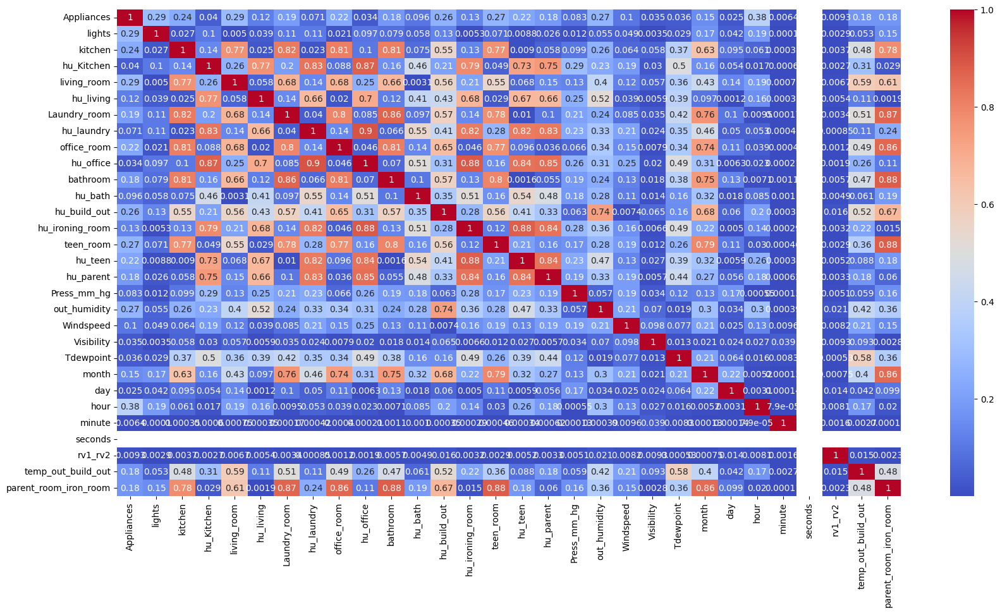

In [140]:
plt.figure(figsize= ( 20 , 10))
correlation = fourth_df.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

In [70]:
''' As rv1 and rv2 is too much correlated averaging them would reduce the colinearity.
outside temp and temp out of building have high colinearity and parents room and ironing room have high colinearity.'''

fourth_df['rv1_rv2'] =(fourth_df ['rv1'] + fourth_df['rv2'])/2
fourth_df['temp_out_build_out'] = (fourth_df['temp_out'] + fourth_df['build_out'])/2
fourth_df['parent_room_iron_room'] =(fourth_df['parents_room'] + fourth_df['ironing_room'])/2
fourth_df.drop(['rv1','rv2','temp_out','build_out','parents_room','ironing_room'],axis=1,inplace =True)

In [71]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def Cal_Vif(df):
  VIF = pd.DataFrame()
  VIF['feature']= df.columns
  VIF['VIF'] = [variance_inflation_factor(df.values , i) for i in range(df.shape[1])]
  return VIF

In [72]:
Cal_Vif(fourth_df[[i for i in fourth_df.columns]])

,feature,VIF
0,Appliances,10.531893
1,lights,1.668694
2,kitchen,1334.885151
3,hu_Kitchen,876.950254
4,living_room,627.869013
5,hu_living,593.327337
6,Laundry_room,929.407023
7,hu_laundry,1452.929040
8,office_room,728.444288
9,hu_office,1244.327032


In [73]:
Cal_Vif(fourth_df[[i for i in fourth_df.columns if i not in ['Laundry_room','hu_laundry','ironing_room','hu_ironing_room']]])

,feature,VIF
0,Appliances,10.489432
1,lights,1.665827
2,kitchen,1236.832212
3,hu_Kitchen,783.239721
4,living_room,599.732468
5,hu_living,578.462590
6,office_room,719.882413
7,hu_office,1071.772831
8,bathroom,778.666924
9,hu_bath,130.955469


Even after Calculating and observing the variance inflation factors for all the features and extracting some of them, the feature manipulation have not worked for reducing the multicollinearity.

#### 2. Feature Selection

In [74]:
# Select your features wisely to avoid overfitting
independent_variable =[i for i in fourth_df.columns if i not in ['Appliances']]
dependent_variable = 'Appliances'

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

Yes, following code gives a list of features which are skew symmetric and not balanced.

In [75]:
# Transform Your data
symmetric_col=[]
skew_symmetric=[]
for i in fourth_df.columns:
  if abs(fourth_df[i].mean() - fourth_df[i].median()) > 0.1:
    skew_symmetric.append(i)
  else:
    symmetric_col.append(i)

print(f'Syemmetric columns are {symmetric_col} ')
print(f'skew_symmetric columns are {skew_symmetric} ')

Syemmetric columns are ['kitchen', 'hu_living', 'teen_room', 'day', 'seconds', 'rv1_rv2'] 
skew_symmetric columns are ['Appliances', 'lights', 'hu_Kitchen', 'living_room', 'Laundry_room', 'hu_laundry', 'office_room', 'hu_office', 'bathroom', 'hu_bath', 'hu_build_out', 'hu_ironing_room', 'hu_teen', 'hu_parent', 'Press_mm_hg', 'out_humidity', 'Windspeed', 'Visibility', 'Tdewpoint', 'month', 'hour', 'minute', 'temp_out_build_out', 'parent_room_iron_room'] 


[]

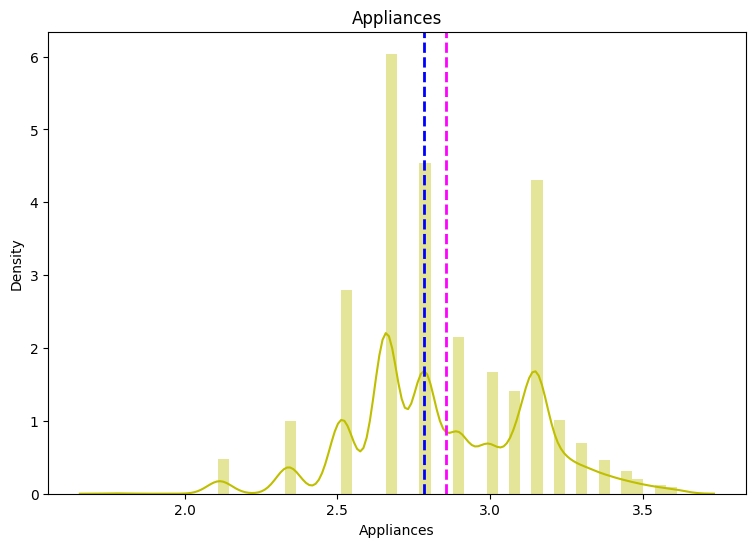

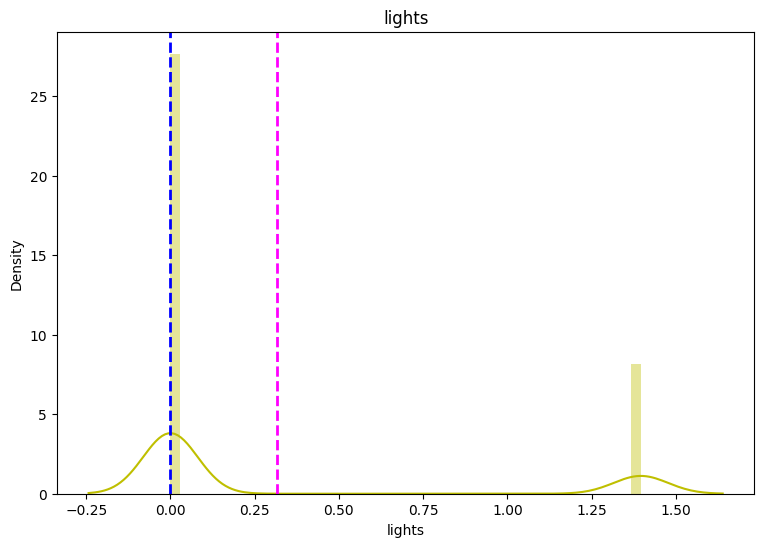

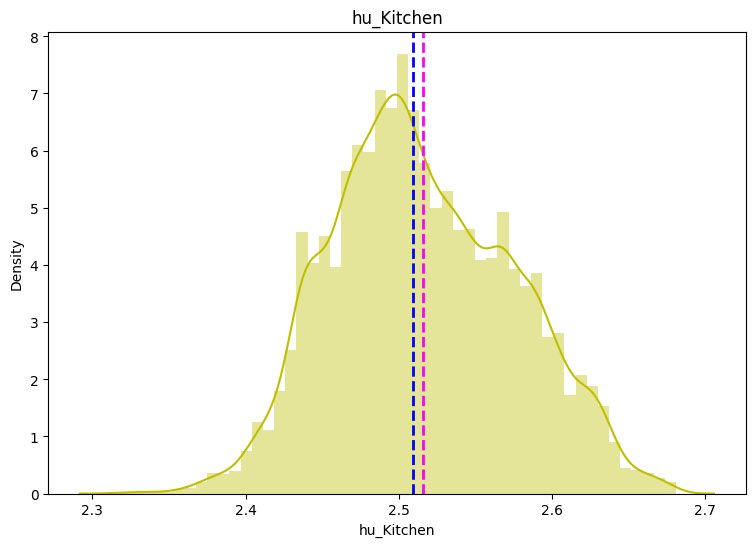

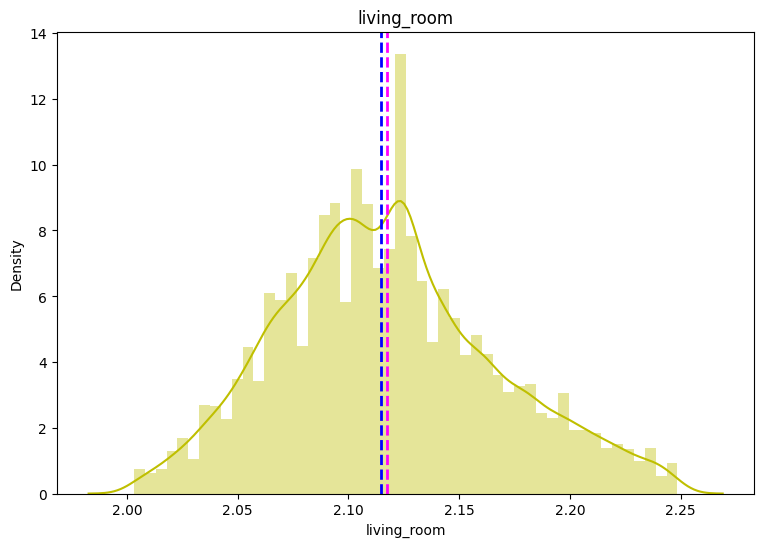

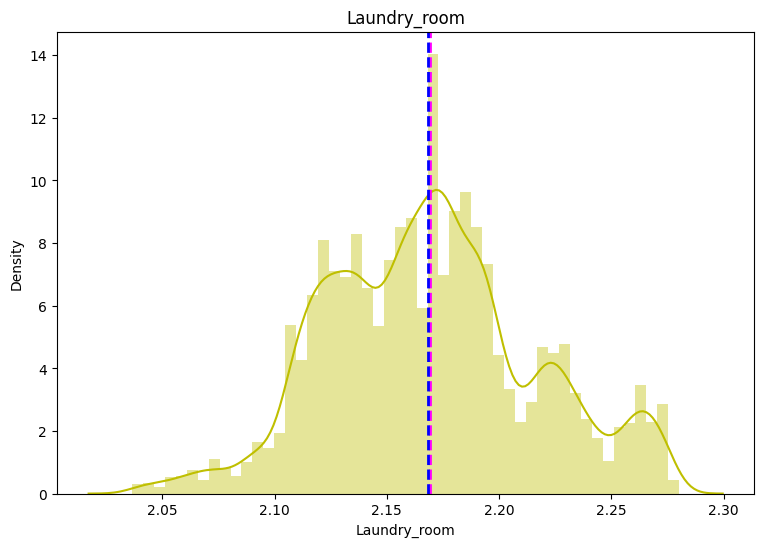

...

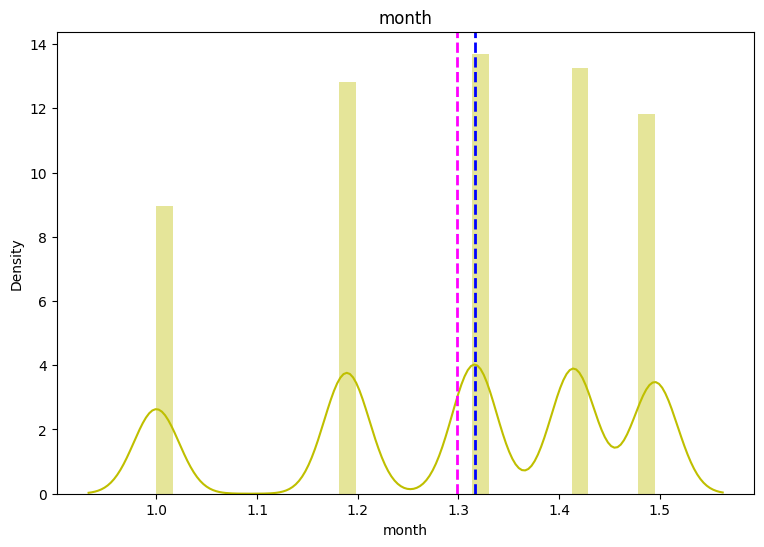

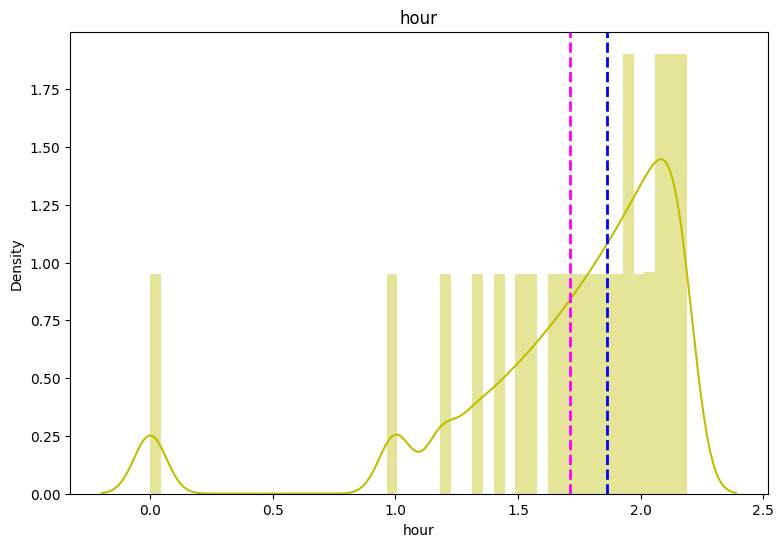

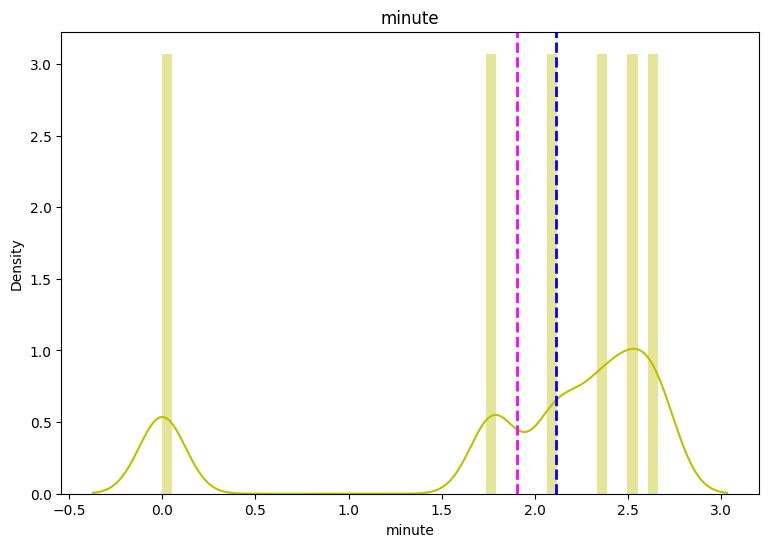

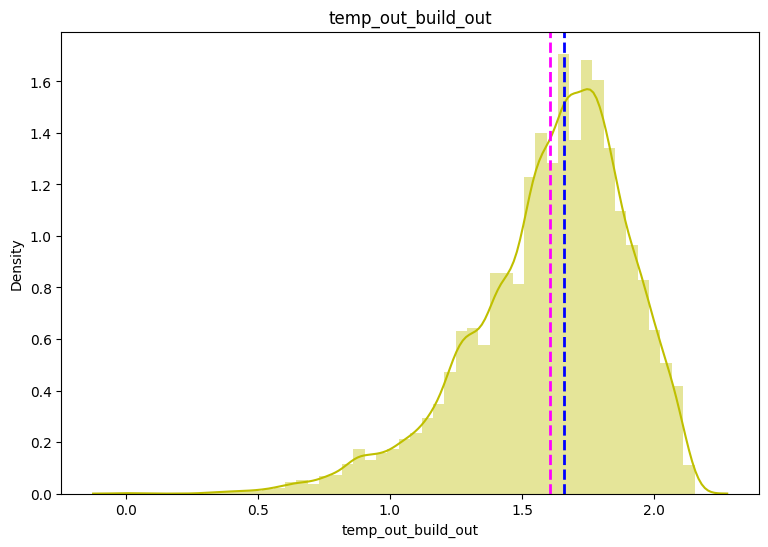

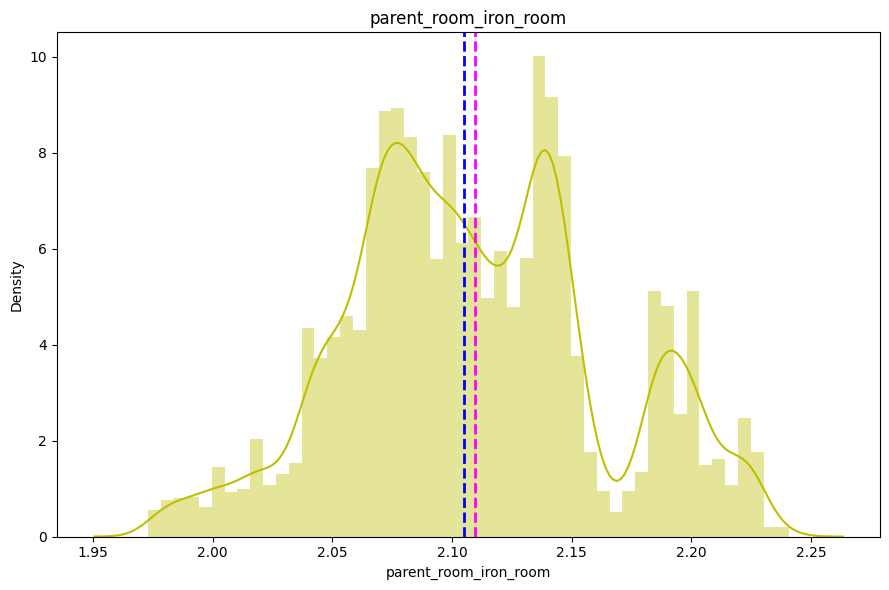

In [76]:
# ploting the distribution plot for all the skew-symmetric features

for i in fourth_df[skew_symmetric].columns:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature= (fourth_df[i])**0.25
  sns.distplot(feature,color='y')
  ax.axvline(feature.mean(),color='magenta', linestyle='dashed', linewidth=2)
  ax.axvline(feature.median(),color='b', linestyle='dashed', linewidth=2)
  ax.set_title(i)
plt.tight_layout()
plt.plot()

In [77]:
# putting the transformed values in our desired dataframe.

'''The transformation will occur only for those features which shows the skew symmetric distribution.'''

for i in skew_symmetric:
  fourth_df[i]=(fourth_df[i])**0.25

In [78]:
fourth_df.isnull().sum()

Appliances                  0
lights                      0
kitchen                     0
hu_Kitchen                  0
living_room                 0
hu_living                   0
Laundry_room                0
hu_laundry                  0
office_room                 0
hu_office                   0
bathroom                    0
hu_bath                     0
hu_build_out                0
hu_ironing_room             0
teen_room                   0
hu_teen                     0
hu_parent                   0
Press_mm_hg                 0
out_humidity                0
Windspeed                   0
Visibility                  0
Tdewpoint                3237
month                       0
day                         0
hour                        0
minute                      0
seconds                     0
rv1_rv2                     0
temp_out_build_out       1257
parent_room_iron_room       0
dtype: int64

In [79]:
# exponential transformation have created some null points in two columns,'Tdewpoint' and 'temp_out_build_out'
fourth_df['Tdewpoint'].fillna(fourth_df['Tdewpoint'].mean(),inplace=True)
fourth_df['temp_out_build_out'].fillna(fourth_df['temp_out_build_out'].mean(),inplace=True)

In [80]:
fourth_df.isnull().sum()

Appliances               0
lights                   0
kitchen                  0
hu_Kitchen               0
living_room              0
hu_living                0
Laundry_room             0
hu_laundry               0
office_room              0
hu_office                0
bathroom                 0
hu_bath                  0
hu_build_out             0
hu_ironing_room          0
teen_room                0
hu_teen                  0
hu_parent                0
Press_mm_hg              0
out_humidity             0
Windspeed                0
Visibility               0
Tdewpoint                0
month                    0
day                      0
hour                     0
minute                   0
seconds                  0
rv1_rv2                  0
temp_out_build_out       0
parent_room_iron_room    0
dtype: int64

In [81]:
symmetric_col1=[]
skew_symmetric1=[]
for i in fourth_df.columns:
  if abs(fourth_df[i].mean() - fourth_df[i].median()) > 0.1:
    skew_symmetric1.append(i)
  else:
    symmetric_col1.append(i)

print(f'Syemmetric columns are {symmetric_col1} ')
print(f'skew_symmetric columns are {skew_symmetric1} ')

Syemmetric columns are ['Appliances', 'kitchen', 'hu_Kitchen', 'living_room', 'hu_living', 'Laundry_room', 'hu_laundry', 'office_room', 'hu_office', 'bathroom', 'hu_bath', 'hu_ironing_room', 'teen_room', 'hu_teen', 'hu_parent', 'Press_mm_hg', 'out_humidity', 'Windspeed', 'Visibility', 'Tdewpoint', 'month', 'day', 'seconds', 'rv1_rv2', 'temp_out_build_out', 'parent_room_iron_room'] 
skew_symmetric columns are ['lights', 'hu_build_out', 'hour', 'minute'] 


<Axes: >

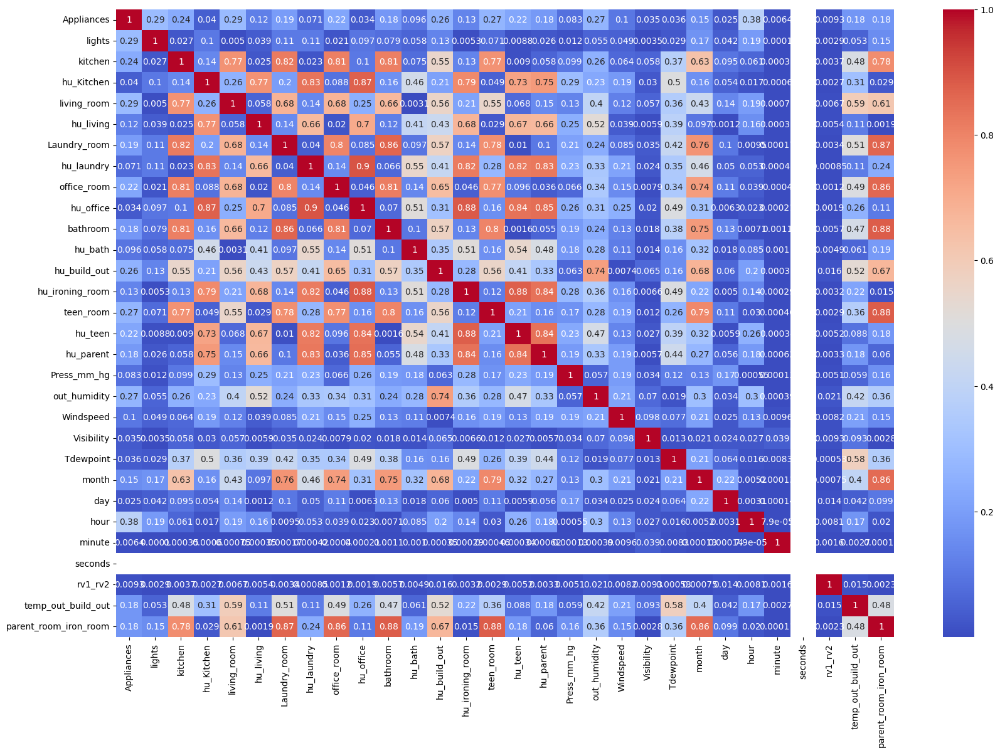

In [82]:
plt.figure(figsize=(20,13))
correlation = fourth_df.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

##### Which method have you used to scale you data and why?

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Answer Here.
> The Dataset contains highly correlated feature and they are not getting treated propelry by feature engineering or feature selection. 

> The Variance inflation factor shows the feature coefficients are higly inflated. e.g kitchen temperature feature

In [83]:
# DImensionality Reduction (If needed)
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(fourth_df[independent_variable])
pca_df = pca.transform(fourth_df[independent_variable])
# X_test_trf= pca.transform(X_test1)



<Axes: >

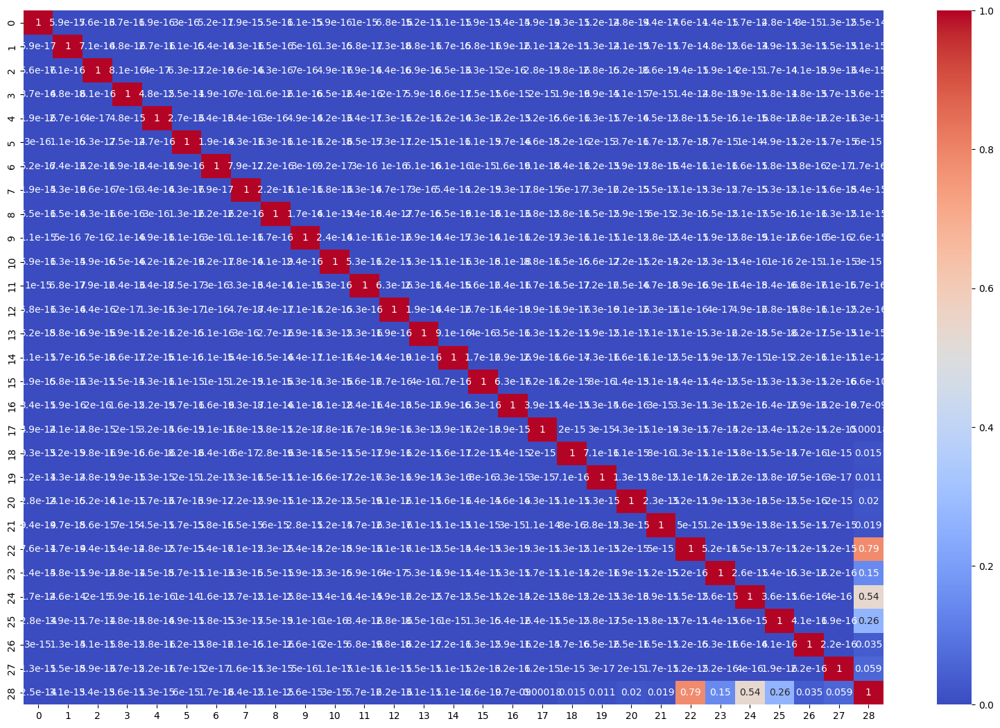

In [84]:
plt.figure(figsize=(20,13))
correlation = pd.DataFrame(pca_df).corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

As I have tried and tested for reducing the  various components of Dataset, the accuracy was maximum for the present model.

> Hence I have not decided the number of components but I have considered all the features to be tested upon.

### 8.Data Splitting

In [85]:
model_df = pd.DataFrame(pca_df,columns=fourth_df[independent_variable].columns)

X_train ,X_test,Y_train,Y_test = train_test_split(model_df.values,fourth_df[dependent_variable].values)
print(X_train.shape,X_test.shape)
print(Y_train.shape,Y_test.shape)

(14801, 29) (4934, 29)
(14801,) (4934,)


## ***7. ML Model Implementation***

### ML Model - 1

#### first model is simple Linear Regression.

In [86]:
# these list stores the values of tested models.
Model=[]
train_accu=[]
test_accu=[]

In [87]:
# ML Model - 1 Implementation
reg= LinearRegression()

# Fit the Algorithm
reg.fit(X_train,Y_train)

# Predict on the model
y_pred = reg.predict(X_test)


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [88]:
# Visualizing evaluation Metric Score chart
train_accuracy = reg.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,reg.predict(X_test))
print('Train accuracy for the given Linear_regression is ',train_accuracy)
print('Test accuracy for the given Linear_regression is ',test_accuracy)

Train accuracy for the given Linear_regression is  0.35153086458313654
Test accuracy for the given Linear_regression is  0.3374133051214834


In [89]:
Model.append('Linear_Regression')
train_accu.append(reg.score(X_train,Y_train))
test_accu.append(r2_score(Y_test, reg.predict(X_test)))

#### 2. Cross- Validation & Hyperparameter Tuning

In [90]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
lasso = Lasso()
# Fit the Algorithm

'''Hyperparameter tuning for Lasso regression'''

parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100]}
lasso_regressor = GridSearchCV(lasso, parameters, scoring='neg_mean_squared_error', cv=3 )
lasso_regressor.fit(X_train, Y_train)
# Predict on the model
print("The best fit alpha value is found out to be :" ,lasso_regressor.best_params_)
print("\nUsing ",lasso_regressor.best_params_, " the negative mean squared error is: ", lasso_regressor.best_score_)

The best fit alpha value is found out to be : {'alpha': 1e-08}

Using  {'alpha': 1e-08}  the negative mean squared error is:  -0.05542042943987402


In [91]:
lasso_best=Lasso(alpha= 0.0001)
lasso_best.fit(X_train, Y_train)


Lasso(alpha=0.0001)

In [92]:
train_accuracy = lasso_best.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,lasso_best.predict(X_test))
print('Train accuracy for the given Lasso_regression is ',train_accuracy)
print('Test accuracy for the given Lasso_regression is ',test_accuracy)

Train accuracy for the given Lasso_regression is  0.3474978628023726
Test accuracy for the given Lasso_regression is  0.3361355981533909


In [93]:
Model.append('Lasso_Regression')
train_accu.append(train_accuracy)
test_accu.append(test_accuracy)

#### Hyper parameter tuning for ridge regression.

In [94]:
ridge = Ridge()
parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100]}
ridge_regressor = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv=3)
ridge_regressor.fit(X_train,Y_train)
print("The best fit alpha value is found out to be :" ,ridge_regressor.best_params_)
print("\nUsing ",ridge_regressor.best_params_, " the negative mean squared error is: ", ridge_regressor.best_score_)

The best fit alpha value is found out to be : {'alpha': 0.01}

Using  {'alpha': 0.01}  the negative mean squared error is:  -0.055419846799258536


In [95]:
ridge_best = Ridge(alpha= 0.01)
ridge_best.fit(X_train,Y_train)

Ridge(alpha=0.01)

In [96]:
train_accuracy = ridge_best.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,ridge_best.predict(X_test))
print('Train accuracy for the given Ridge_regression is ',train_accuracy)
print('Test accuracy for the given Ridge_regression is ',test_accuracy)

Train accuracy for the given Ridge_regression is  0.3515305029964424
Test accuracy for the given Ridge_regression is  0.33743519659122423


In [97]:
Model.append('Ridge_Regression')
train_accu.append(train_accuracy)
test_accu.append(test_accuracy)

##### Which hyperparameter optimization technique have you used and why?

**for cross validation I have used GridSearchCv, as it is the best suitable method for finding the hyperparameter values.**

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

**Very negligible amount of change have been appera after the cross validation.**

### ML Model - 2

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [98]:
DTR=DecisionTreeRegressor(max_depth=12)
DTR.fit(X_train,Y_train)

DecisionTreeRegressor(max_depth=12)

In [99]:
train_accuracy = DTR.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,DTR.predict(X_test))
print('Train accuracy for the given DTR is ',train_accuracy)
print('Test accuracy for the given DTR is ',test_accuracy)

Train accuracy for the given DTR is  0.7222062928676838
Test accuracy for the given DTR is  0.4644019532322897


In [100]:
Model.append('DecisionTreeRegressor')
train_accu.append(train_accuracy)
test_accu.append(test_accuracy)

In [101]:
# Visualizing evaluation Metric Score chart

#### 2. Cross- Validation & Hyperparameter Tuning

In [102]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
DTR_CV= DecisionTreeRegressor()
# Fit the Algorithm
param_grid = {
              "min_samples_split": [10, 20, 40],
              "max_depth": [2, 6, 8],
              "min_samples_leaf": [20, 40, 100],
              "max_leaf_nodes": [5, 20, 100],
              }

## Comment in order to publish in kaggle.

grid_cv_DTR = GridSearchCV(DTR_CV, param_grid, cv=5)

grid_cv_DTR.fit(X_train,Y_train)
# Predict on the model

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [2, 6, 8], 'max_leaf_nodes': [5, 20, 100],
                         'min_samples_leaf': [20, 40, 100],
                         'min_samples_split': [10, 20, 40]})

In [103]:
grid_cv_DTR.best_params_

{'max_depth': 8,
 'max_leaf_nodes': 100,
 'min_samples_leaf': 20,
 'min_samples_split': 10}

In [104]:
DTR_best=DecisionTreeRegressor(max_depth= 60,max_leaf_nodes=700,min_samples_leaf= 5,min_samples_split=10)
DTR_best.fit(X_train,Y_train)

DecisionTreeRegressor(max_depth=60, max_leaf_nodes=700, min_samples_leaf=5,
                      min_samples_split=10)

In [105]:
train_accuracy = DTR_best.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,DTR_best.predict(X_test))
print('Train accuracy for the given model DecisionTreeRegressor_CV is ',train_accuracy)
print('Test accuracy for the given model DecisionTreeRegressor_CV is ',test_accuracy)

Train accuracy for the given model DecisionTreeRegressor_CV is  0.7771830855024657
Test accuracy for the given model DecisionTreeRegressor_CV is  0.4827955191767328


In [106]:
Model.append('DecisionTreeRegressor_cv')
train_accu.append(train_accuracy)
test_accu.append(test_accuracy)

> **After applying the decision tree regressor to the model, the accuracy have been increased by 10% first and after tuning the hyper parameters, the accuracy again have incresed by 16% from the base model.**

####  Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

> The model says, training datapoints are 77% accurately predicted and the unseen testing datapoints are 50% accurately predicted.

### ML Model - 3

In [107]:
# ML Model - 3 Implementation
XGBR=XGBRegressor()
# Fit the Algorithm
XGBR.fit(X_train,Y_train)
# Predict on the model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [108]:
train_accuracy = XGBR.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,XGBR.predict(X_test))
print('Train accuracy for the given model XGBRegressor is ',train_accuracy)
print('Test accuracy for the given model XGBRegressor is ',test_accuracy)

Train accuracy for the given model XGBRegressor is  0.857259888651906
Test accuracy for the given model XGBRegressor is  0.6031039189171699


In [109]:
Model.append('XGBRegressor')
train_accu.append(train_accuracy)
test_accu.append(test_accuracy)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

> **The XGboost Regressor have helped me to bring my test accuacy atleast upto the desired level of consideration.**

> **This model shows near about 85% accuracy for train data and 61% of accuracy in test data.**

#### 2. Cross- Validation & Hyperparameter Tuning

In [110]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
XGBR_CV =XGBRegressor()

params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

grid_cv_XGBR = RandomizedSearchCV(XGBR_CV, param_distributions=params, 
                                   n_iter=5, scoring='roc_auc',
                                   n_jobs=4, cv=5, verbose=3, random_state=1001 )

grid_cv_XGBR.fit(X_train,Y_train)
# Predict on the model

Fitting 5 folds for each of 5 candidates, totalling 25 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          predictor=None, random_state=None, ...),
                   n_iter=5, n_jobs=4,
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0.5, 1, 1.5, 2, 5],
                                        'max_depth': [3, 4, 5],
                                        'min_child_weight': [1, 5, 10],
                                        'subsample': [0.6, 0.8, 1.0]},
                   random_state=1001, scoring='roc_auc', verbose=3)

In [111]:
grid_cv_XGBR.best_params_

{'subsample': 1.0,
 'min_child_weight': 5,
 'max_depth': 3,
 'gamma': 5,
 'colsample_bytree': 1.0}

In [112]:
XGBR_best=XGBRegressor(min_child_weight= 10,max_depth= 12,gamma=0.1)
XGBR_best.fit(X_train,Y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=12, max_leaves=None,
             min_child_weight=10, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [113]:
train_accuracy = XGBR_best.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,XGBR_best.predict(X_test))
print('Train accuracy for the given model XGBRegressor_CV is ',train_accuracy)
print('Test accuracy for the given model XGBRegressor_CV is ',test_accuracy)

Train accuracy for the given model XGBRegressor_CV is  0.8741383607340361
Test accuracy for the given model XGBRegressor_CV is  0.6257794451512264


In [114]:
Model.append('XGBRegressor_cv')
train_accu.append(train_accuracy)
test_accu.append(test_accuracy)

In [147]:
y_pred=XGBR_best.predict(X_test)

Text(0.5, 1.0, 'XGBRegressor')

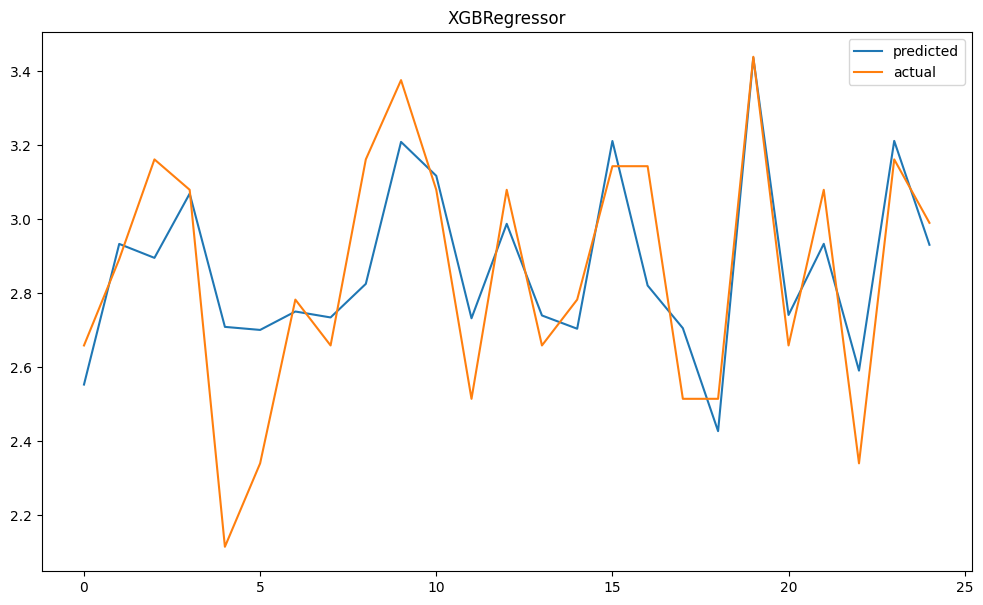

In [149]:
#Visualizing the Evaluated Model

plt.figure(figsize=(12,7))
plt.plot(y_pred[:25], label='predicted')
plt.plot(Y_test[:25], label='actual')
plt.legend(loc='best')
plt.title('XGBRegressor')

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

> **After the hyper parameter tuning the XGboost have increased its accuracy on both test data and test data.**

> **it has increased from 85 to 89% for train data and for test it has increased from 61% to 62%. which is very less improvememnt.**

### ML Model - 4
**HistGradientBoostingRegressor**

In [115]:
HGBR=HistGradientBoostingRegressor()
HGBR.fit(X_train,Y_train)

HistGradientBoostingRegressor()

In [116]:
train_accuracy = HGBR.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,HGBR.predict(X_test))
print('Train accuracy for the given model HistGradientBoostingRegressor is ',train_accuracy)
print('Test accuracy for the given model HistGradientBoostingRegressor is ',test_accuracy)

Train accuracy for the given model HistGradientBoostingRegressor is  0.7066131092717044
Test accuracy for the given model HistGradientBoostingRegressor is  0.5893168635753705


In [117]:
Model.append('HistGradientBoostingRegressor')
train_accu.append(train_accuracy)
test_accu.append(test_accuracy)

In [118]:
print(len(Model))
print(len(train_accu))
print(len(test_accu))

8
8
8


In [119]:
eval_metric=pd.DataFrame({'Models':Model,
                          'train_accuracy':train_accu,
                          'test_accuracy':test_accu})

In [120]:
eval_metric

,Models,train_accuracy,test_accuracy
0,Linear_Regression,0.351531,0.337413
1,Lasso_Regression,0.347498,0.336136
2,Ridge_Regression,0.351531,0.337435
3,DecisionTreeRegressor,0.722206,0.464402
4,DecisionTreeRegressor_cv,0.777183,0.482796
5,XGBRegressor,0.857260,0.603104
6,XGBRegressor_cv,0.874138,0.625779
7,HistGradientBoostingRegressor,0.706613,0.589317


## Feature Imortance

###  Explain the model which you have used and the feature importance using any model explainability tool?

In [121]:
coef=pd.DataFrame(reg.coef_,index=independent_variable).rename(columns={0:'Features'})

Text(0.5, 1.0, 'Coefficients in the XGB Model')

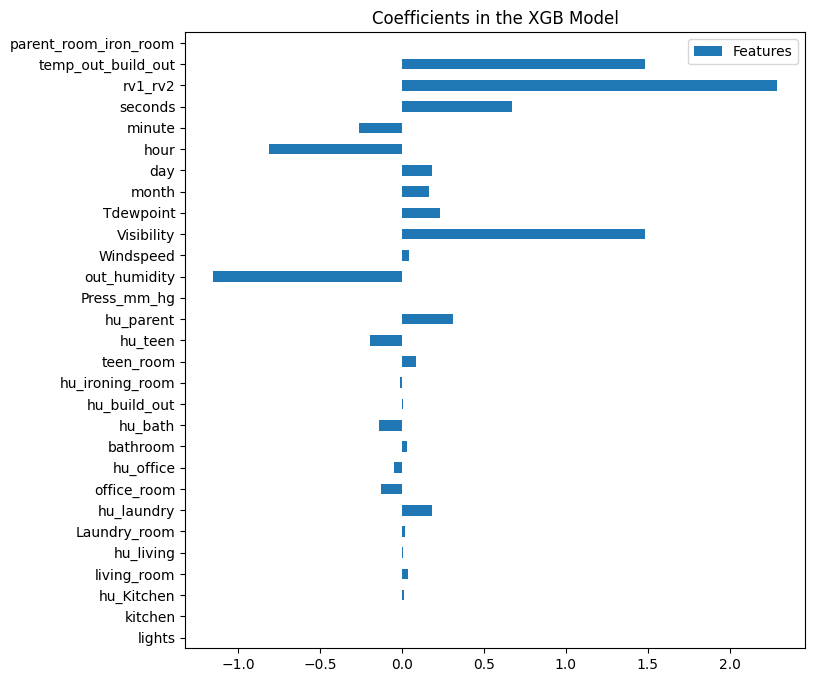

In [122]:
coef.plot(kind = "barh")
plt.title("Coefficients in the XGB Model")

**It has been observed that ,the temperature outside and temperature at parents room are contributing the most significance to the model. In addition with it dew point feature also contributing a significant amount of importance to the model.**

**The minute feature and windspeed feature are reducing the values.**
> **This expresses the importance of outside temperature while operating the internal appliances.**
> **The Arctic countries generally use high energy in their houses due to presence of freezing cold outside.**

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

**r2 score are the more inclined towards correct evaluation.**
> **r2 score calculates the relative error in comparison with other metrics like RMSE which calculates the absolute error.**

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

**XGboost is most important for the businesses because it is more close towards correct prediction, in comparison with other ML Model.**

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [125]:
# Save the File
XGBR_best=XGBRegressor(min_child_weight= 10,max_depth= 12,gamma=0.1)
XGBR_best.fit(X_train,Y_train)
train_accuracy=XGBR_best.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,XGBR_best.predict(X_test))
print(train_accuracy)
print(test_accuracy)

0.8741383607340361
0.6257794451512264


In [126]:
import pickle

In [127]:
with open("Ridge_Regression.pkl", "wb") as f:
    pickle.dump(XGBR_best, f)

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [128]:
# Load the File and predict unseen data.
with open("Ridge_Regression.pkl", "rb") as f:
    unpickled_linear_model = pickle.load(f)

In [129]:
unpickled_linear_model.score(X_train,Y_train)

0.8741383607340361

# **Conclusion**

> **The Linear Regression Model for pedicting the appliances energy shows the  35% accuracy for training dataste and 33% for testing accuracy.**

> **The Lasso and Ridge Regularization do not show much significant improvement over the normal Linear Regression. Only 2% of accuracy have been improved in Regularization.**

> **The Decision Tree Regressor have shown a significant improvement for both train and test accuracy. It shows 72% accuracy for training Dataset an 46% accuracy for the testing Dataset. But still the model is very less in its accuracy.**

> **So Extreme Gradient Boost Regressor is turn to be most significant model here with highest train and test accuracy , 89% and 63% respectively.**

> **It is turn out to be that the Temperature outside the building, temperature of parents room and Dewpoint contributes for maximum significance while calculating the model.**


